In [1]:
import numpy.random as npr

import jax
import jax.numpy as jnp 
import jax.random as jrnd
from jaxutils import Dataset

import tqdm
import matplotlib.pyplot as plt
import ternary
%matplotlib inline
%config InlineBackend.figure_format='retina'
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Imports from our code base
from elliptical_slice_sampler_jax import elliptical_slice_jax
from active_search import get_next_y, get_next_candidate_baseline, get_next_candidate
from plotting import plot_std, plot_distances
from gp_model import update_model, make_preds
from search_no_gpjax import generate_true_function, sample_from_posterior

In [3]:
import pandas

# Load and visualization data

In [4]:
df = pandas.read_csv("../data/PbSnTe.csv")

X_obs = jnp.concatenate([jnp.atleast_2d(jnp.array(df.Pb.to_numpy())), jnp.atleast_2d(jnp.array(df.Te.to_numpy()))]).T

y_obs = jnp.array(df['E_hull (meV/atom)'].to_numpy())[:, jnp.newaxis]
y_diff = jnp.array(df['E_above_hull (meV/atom)'].to_numpy())[:, jnp.newaxis]
tights = y_diff <= 1e-3

design_space = X_obs
true_y = y_obs

pts = []
for x in design_space:
    pts.append(jnp.array([x[0], x[1], 1-x.sum()]))
    
true_envelope = y_obs - y_diff
true_envelope

# observations
train_x = jnp.array([design_space[0], design_space[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
dataset = Dataset(X=train_x, y=train_y) #[:,jnp.newaxis])
designs = design_space[1:-1]

tight_designs = design_space[tights.ravel(),:]
tight_pts = []
for x in tight_designs:
    tight_pts.append(jnp.array([x[0], x[1], 1-x.sum()]))

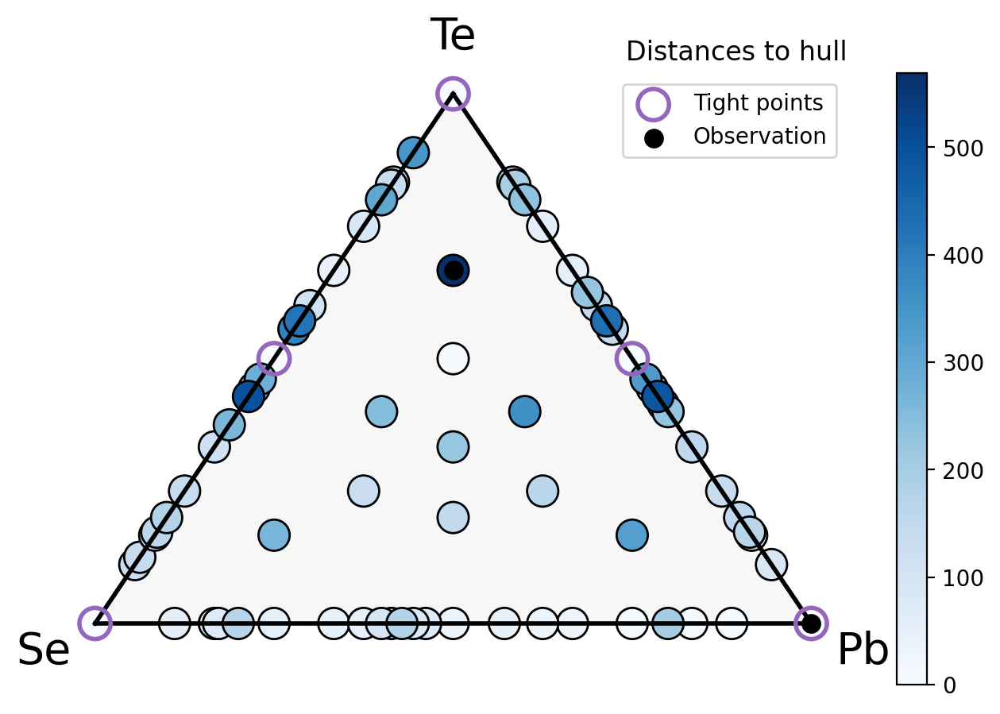

In [5]:
plot_distances(pts, true_y, true_envelope, dataset, tight_pts=tight_pts, plot_design=False, plot_title=True, names=["Pb", "Te", "Se"])

In [6]:
dataset.X

Array([[1.        , 0.        ],
       [0.16666667, 0.66666667]], dtype=float64)

In [7]:
df = pandas.read_csv("../data/AlBaSi.csv")

X_obs = jnp.concatenate([jnp.atleast_2d(jnp.array(df.Al.to_numpy())), jnp.atleast_2d(jnp.array(df.Ba.to_numpy()))]).T

y_obs = jnp.array(df['E_hull (meV/atom)'].to_numpy())[:, jnp.newaxis]
y_diff = jnp.array(df['E_above_hull (meV/atom)'].to_numpy())[:, jnp.newaxis]
tights = y_diff <= 1e-3

design_space = X_obs
true_y = y_obs

pts = []
for x in design_space:
    pts.append(jnp.array([x[0], x[1], 1-x.sum()]))
    
true_envelope = y_obs - y_diff
true_envelope

# observations
train_x = jnp.array([design_space[0], design_space[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
dataset = Dataset(X=train_x, y=train_y) #[:,jnp.newaxis])
designs = design_space[1:-1]

tight_designs = design_space[tights.ravel(),:]
tight_pts = []
for x in tight_designs:
    tight_pts.append(jnp.array([x[0], x[1], 1-x.sum()]))

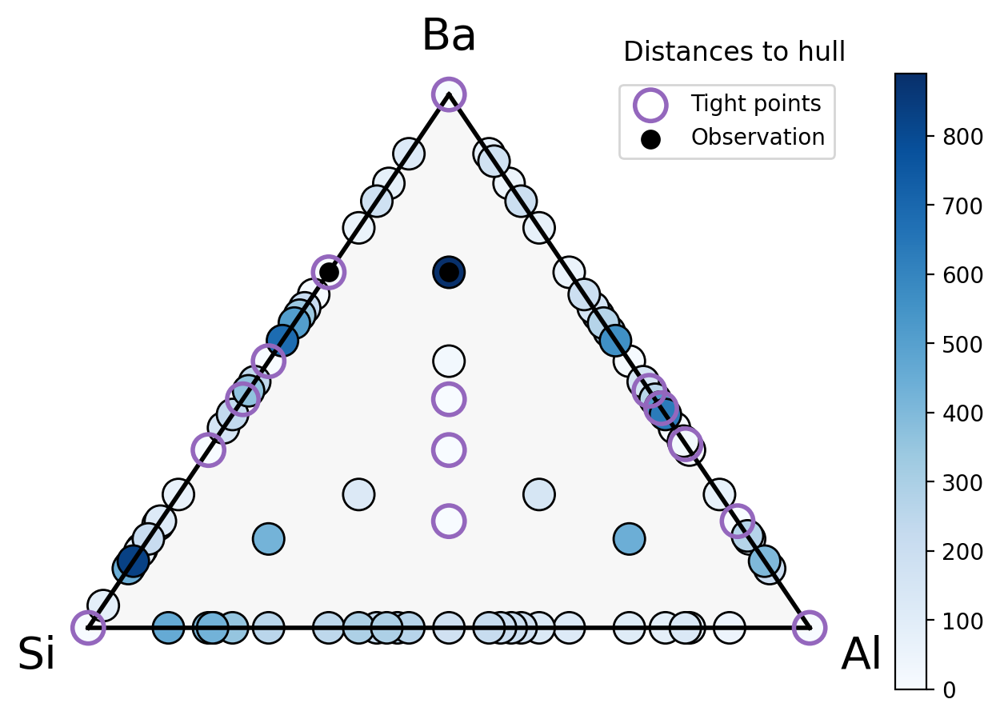

In [8]:
plot_distances(pts, true_y, true_envelope, dataset, tight_pts=tight_pts, plot_design=False, plot_title=True, names=["Al", "Ba", "Si"])

In [11]:
dataset.X

Array([[0.        , 0.66666667],
       [0.16666667, 0.66666667]], dtype=float64)

# Setup problem

In [34]:
#### TODO STILL




n_grid = 10

nx, ny = (n_grid, n_grid)
x = jnp.linspace(0, 1, nx)
y = jnp.linspace(0, 1, ny)
xv, yv = jnp.meshgrid(x, y)
train_x = jnp.array([xv.flatten(),yv.flatten()]).T
# filter out points that are greater than 1
design_space = train_x[train_x.sum(1) <= 1]
pts = []
for x in design_space:
    pts.append(jnp.array([x[0], x[1], 1-x.sum()]))
    
knot_N = len(design_space)

#set seed
npr.seed(10); rng_key = jrnd.PRNGKey(1)

# generate energies
true_y, true_envelope = generate_true_function(design_space, knot_N)

# compute tight points w.r.t. generated data
tights = (true_y - true_envelope) <= 1e-3
tight_designs = design_space[tights.ravel(),:]
tight_pts = []
for x in tight_designs:
    tight_pts.append(jnp.array([x[0], x[1], 1-x.sum()]))

# observations
train_x = jnp.array([design_space[0], design_space[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)

In [37]:
design_space.shape

(55, 2)

# Baseline: no convex hull information

Iteration:  0
CPU times: user 2.72 s, sys: 38.1 ms, total: 2.76 s
Wall time: 2.81 s


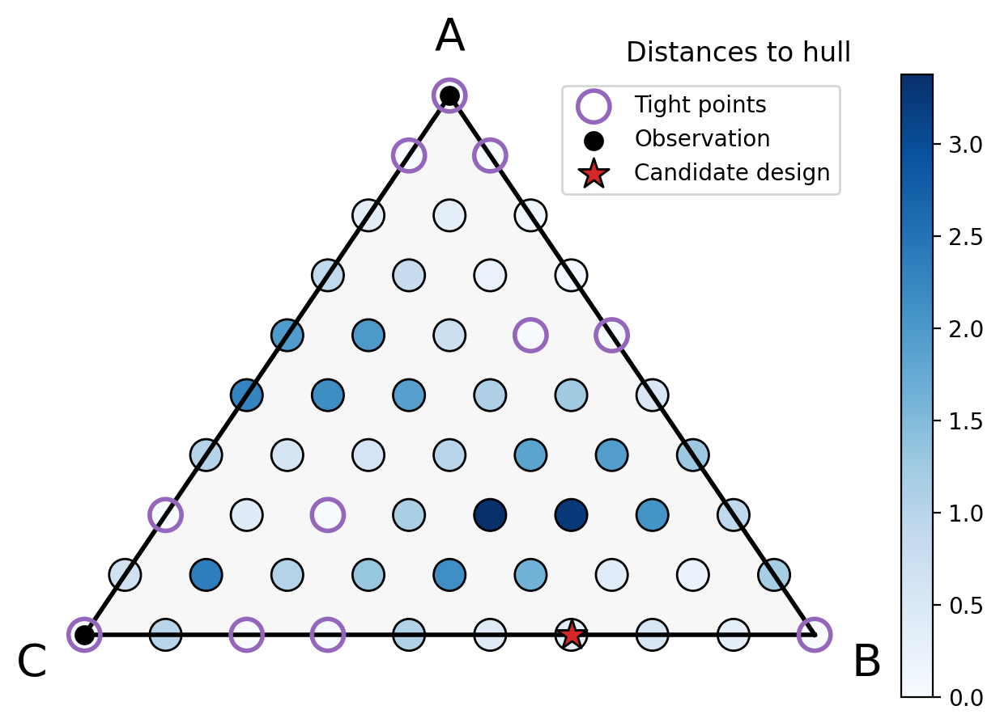

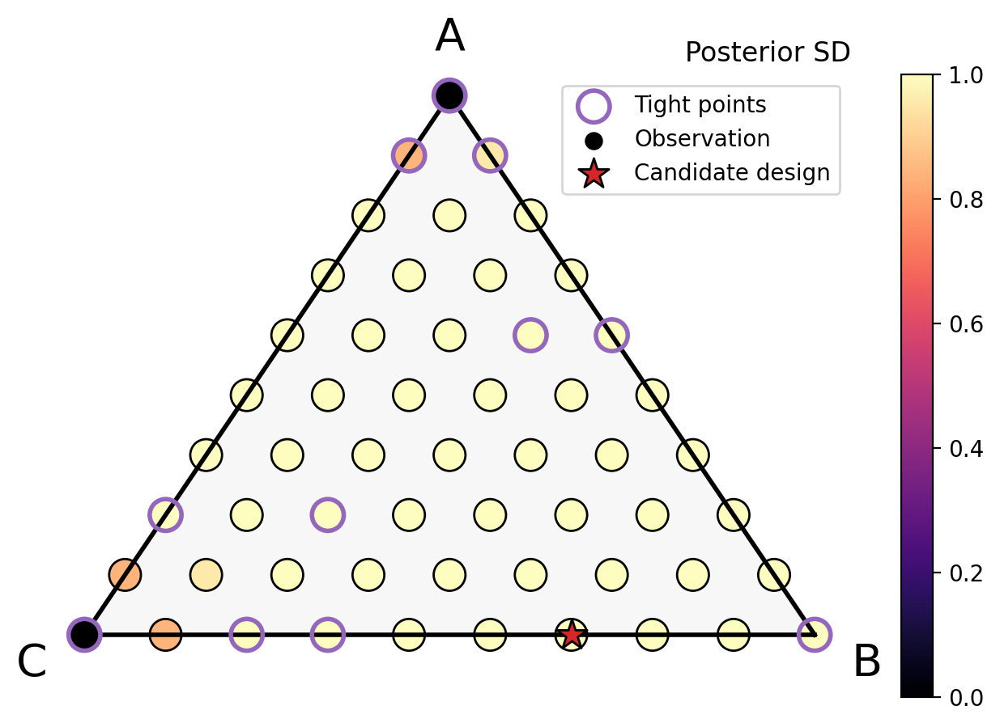

Number of tight points after observing candidate:  2
Iteration:  1
CPU times: user 2.22 s, sys: 19.2 ms, total: 2.24 s
Wall time: 2.24 s


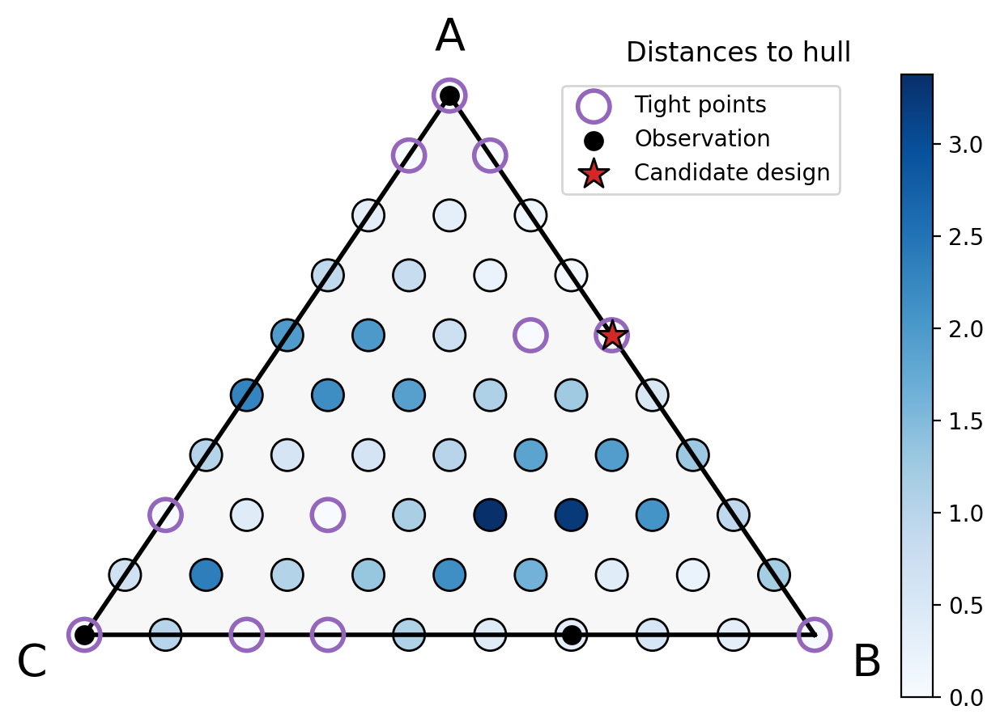

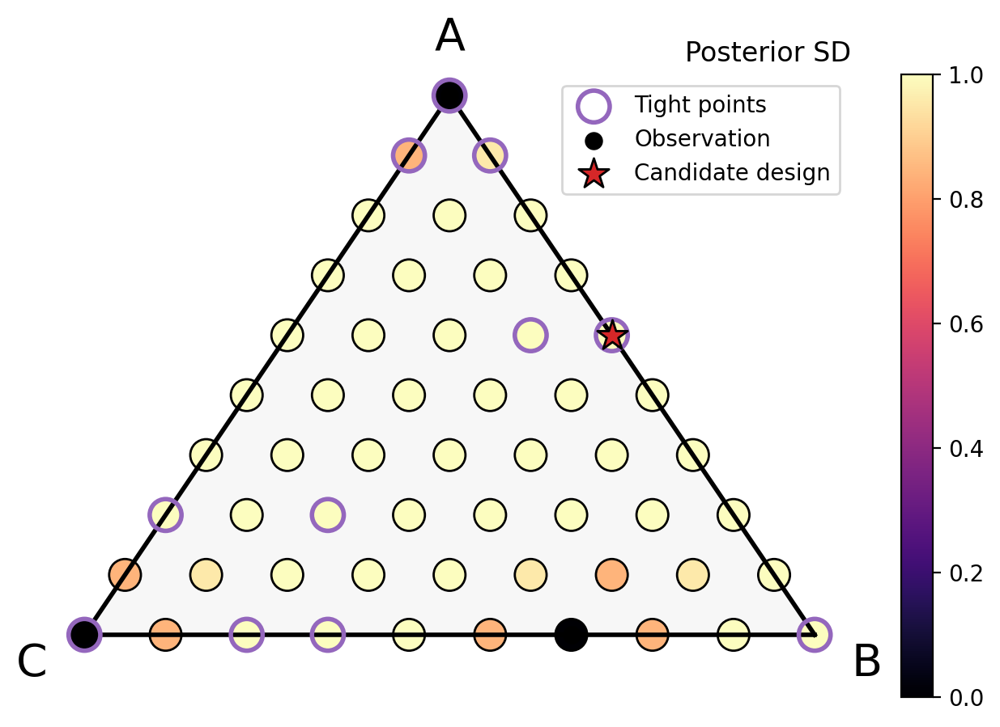

Number of tight points after observing candidate:  3
Iteration:  2
CPU times: user 2.06 s, sys: 12.5 ms, total: 2.07 s
Wall time: 2.07 s


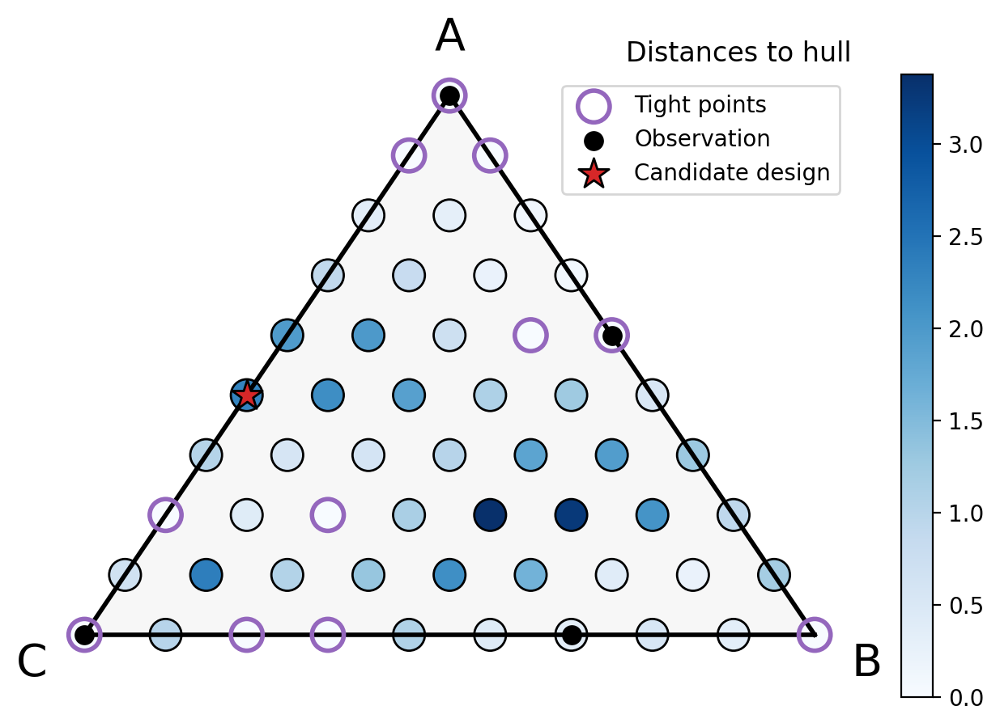

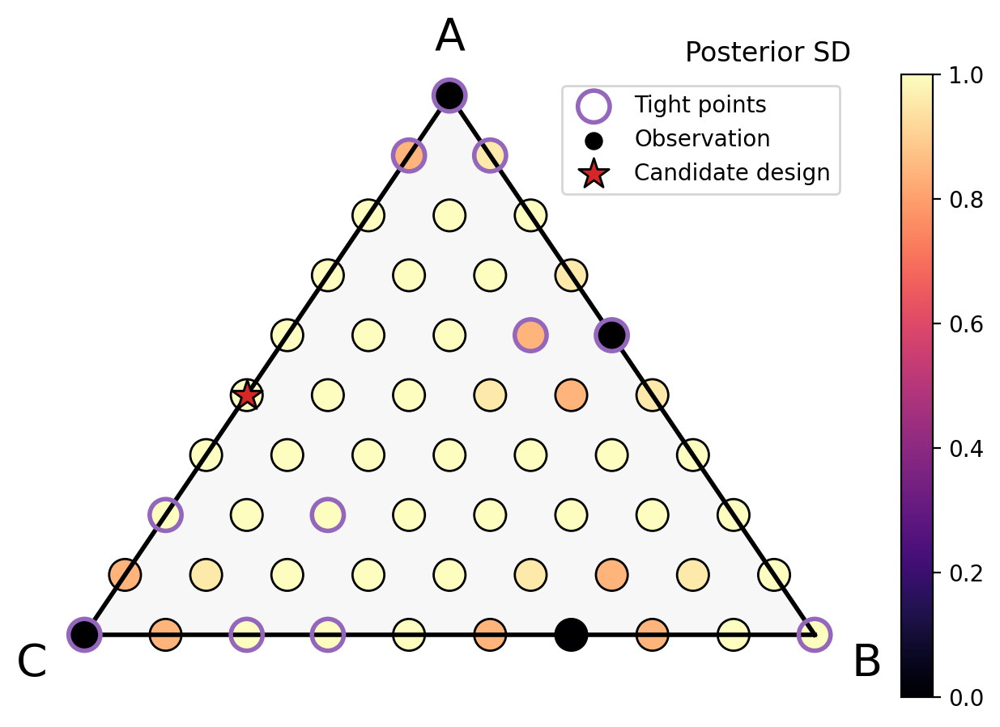

Number of tight points after observing candidate:  3
Iteration:  3
CPU times: user 2.19 s, sys: 24.4 ms, total: 2.22 s
Wall time: 2.23 s


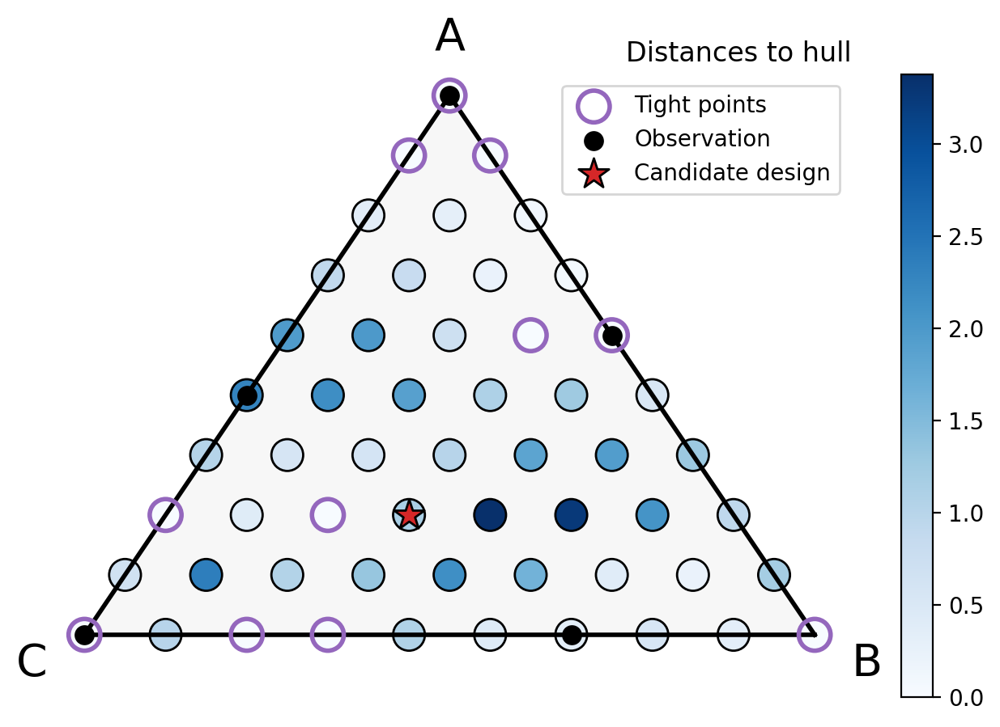

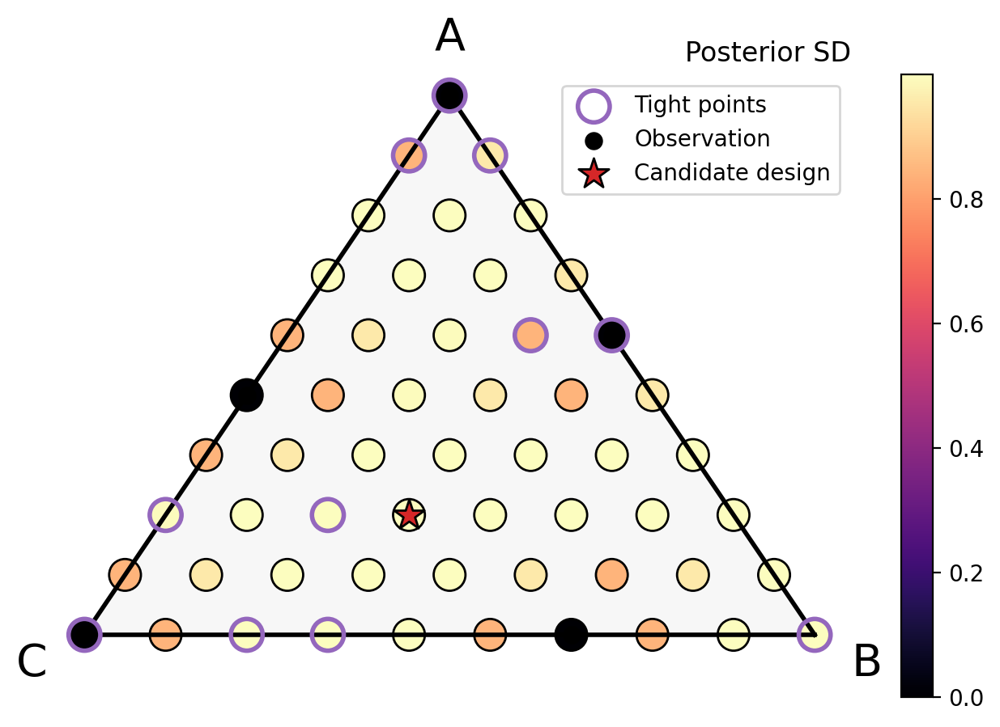

Number of tight points after observing candidate:  3
Iteration:  4
CPU times: user 2.06 s, sys: 15.8 ms, total: 2.08 s
Wall time: 2.08 s


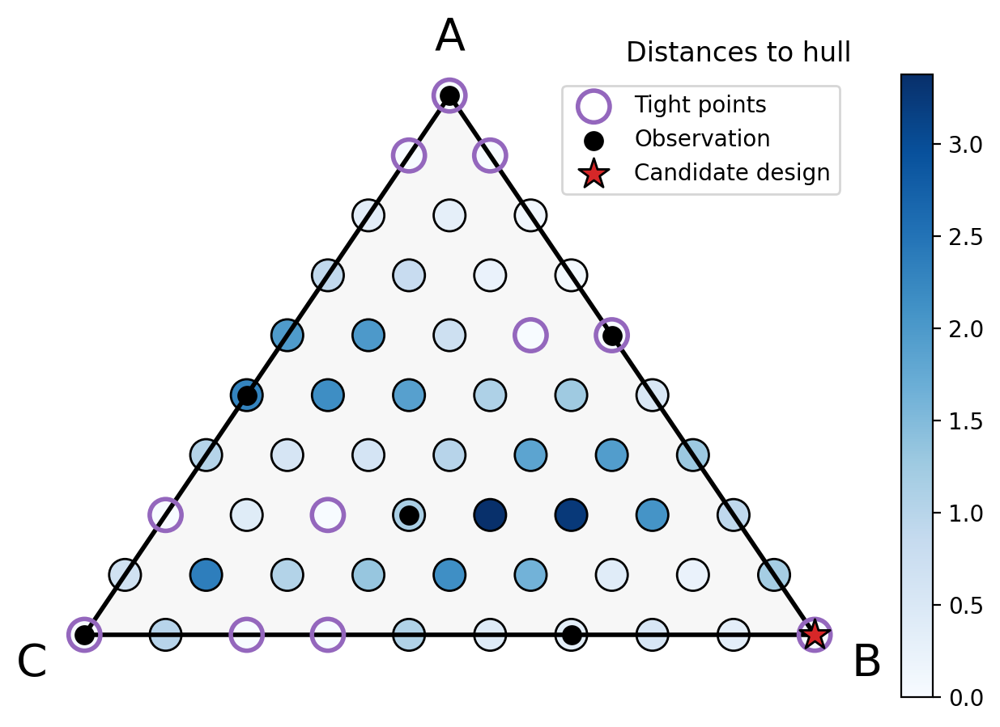

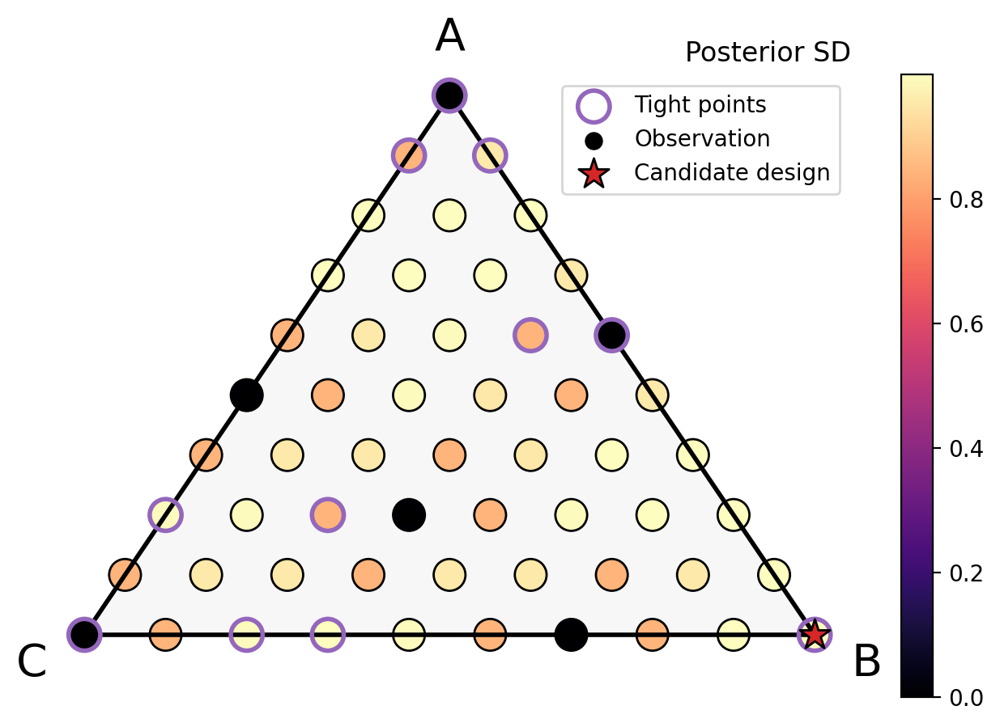

Number of tight points after observing candidate:  4
Iteration:  5
CPU times: user 1.96 s, sys: 11.6 ms, total: 1.97 s
Wall time: 1.97 s


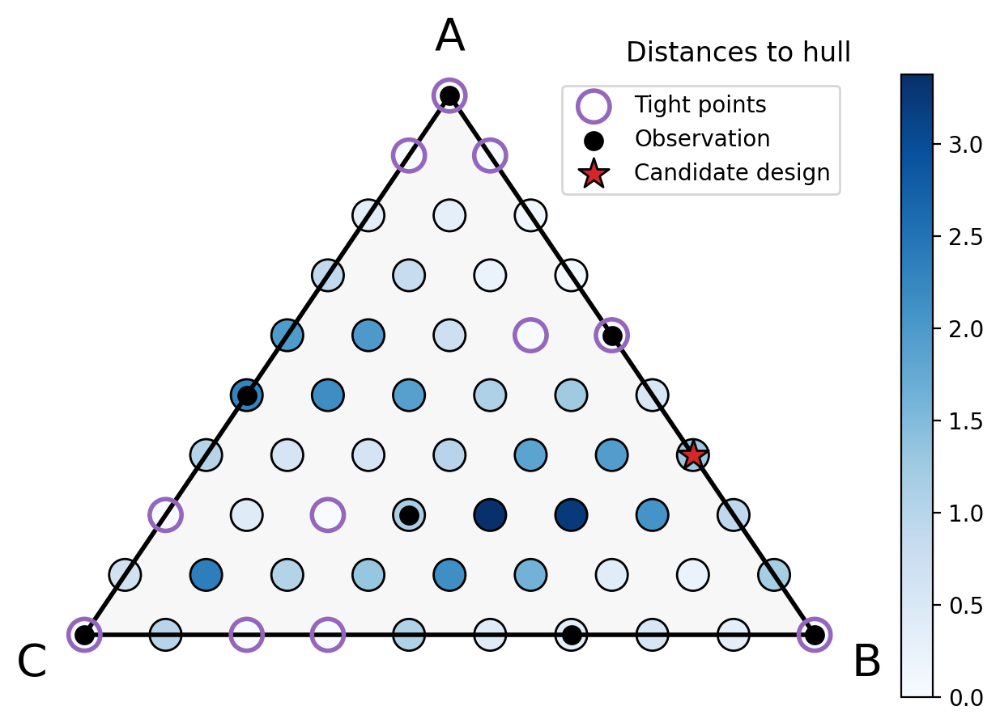

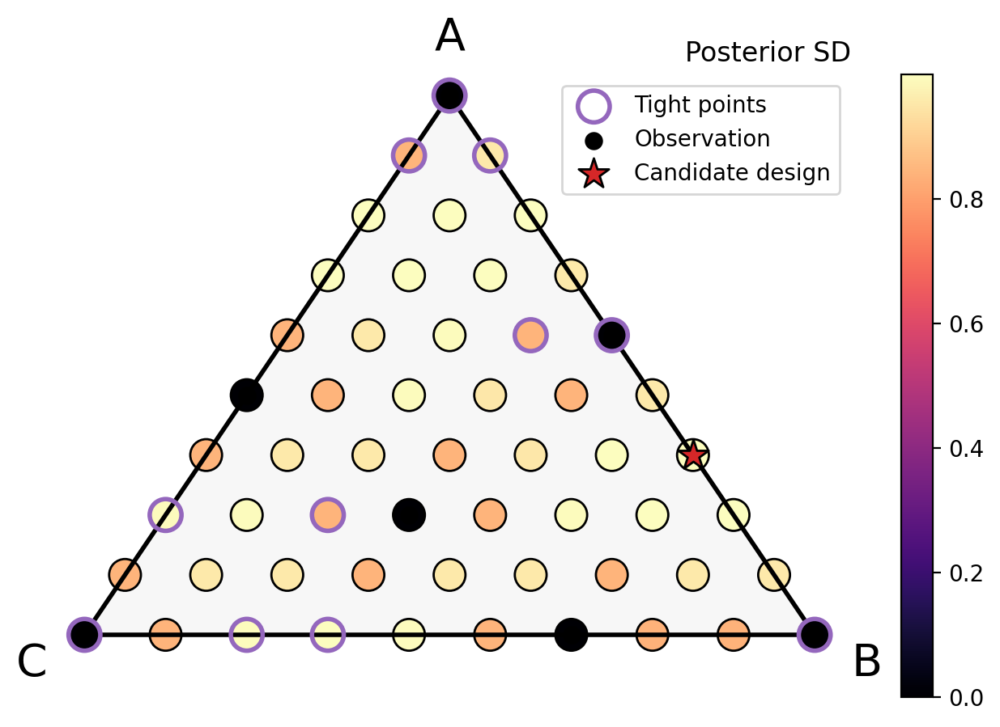

Number of tight points after observing candidate:  4
Iteration:  6
CPU times: user 1.93 s, sys: 10.6 ms, total: 1.94 s
Wall time: 1.94 s


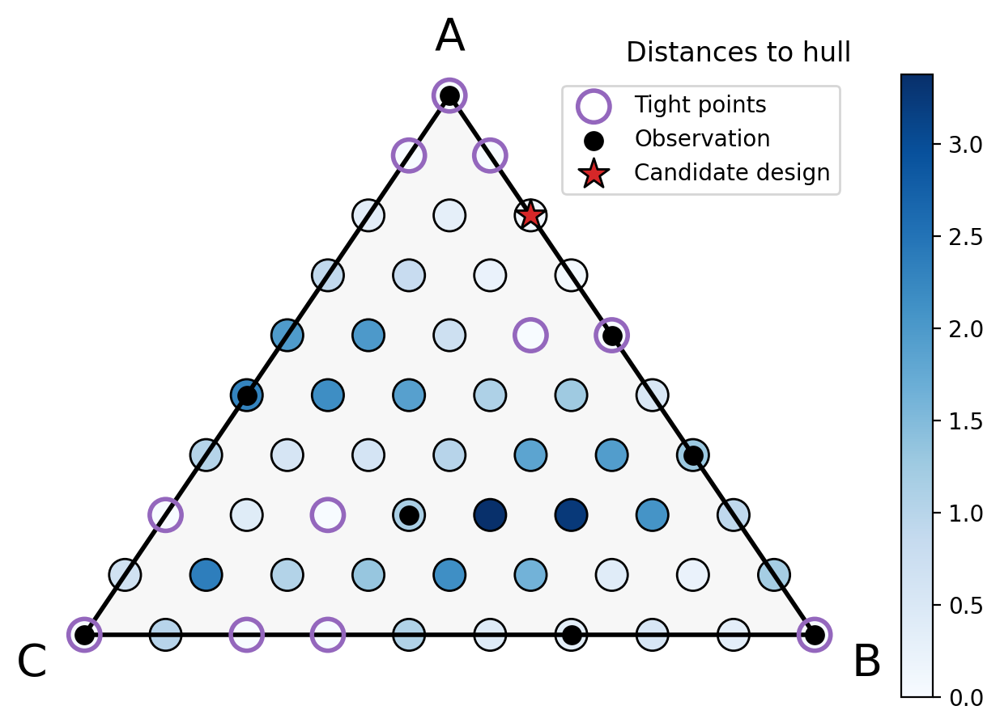

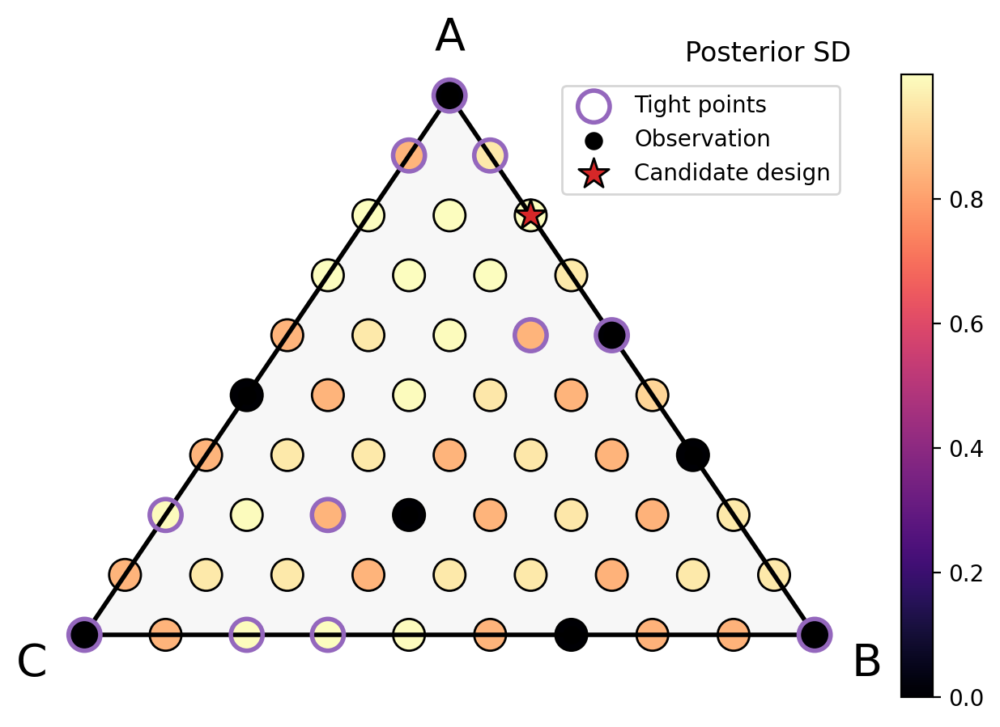

Number of tight points after observing candidate:  4
Iteration:  7
CPU times: user 1.89 s, sys: 12 ms, total: 1.9 s
Wall time: 1.9 s


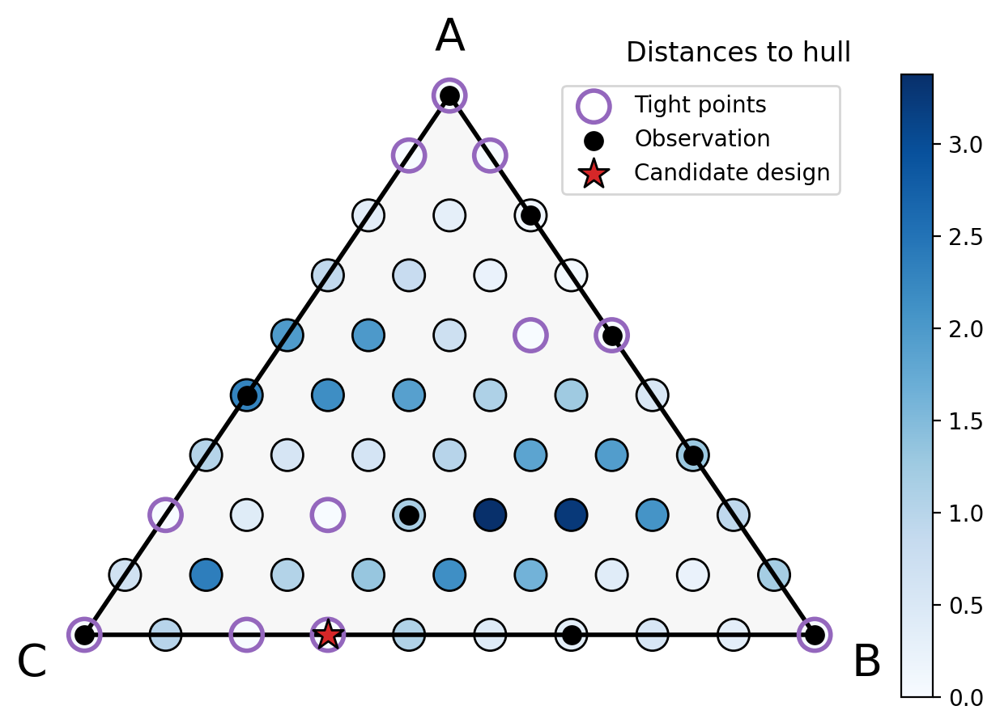

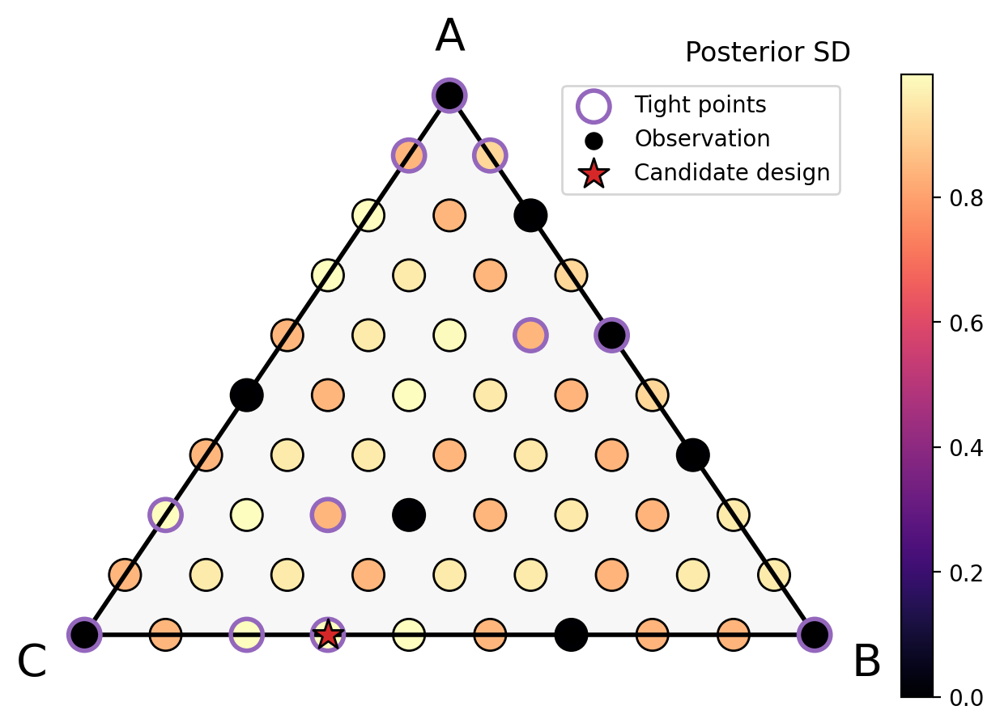

Number of tight points after observing candidate:  5
Iteration:  8
CPU times: user 1.86 s, sys: 10.4 ms, total: 1.87 s
Wall time: 1.87 s


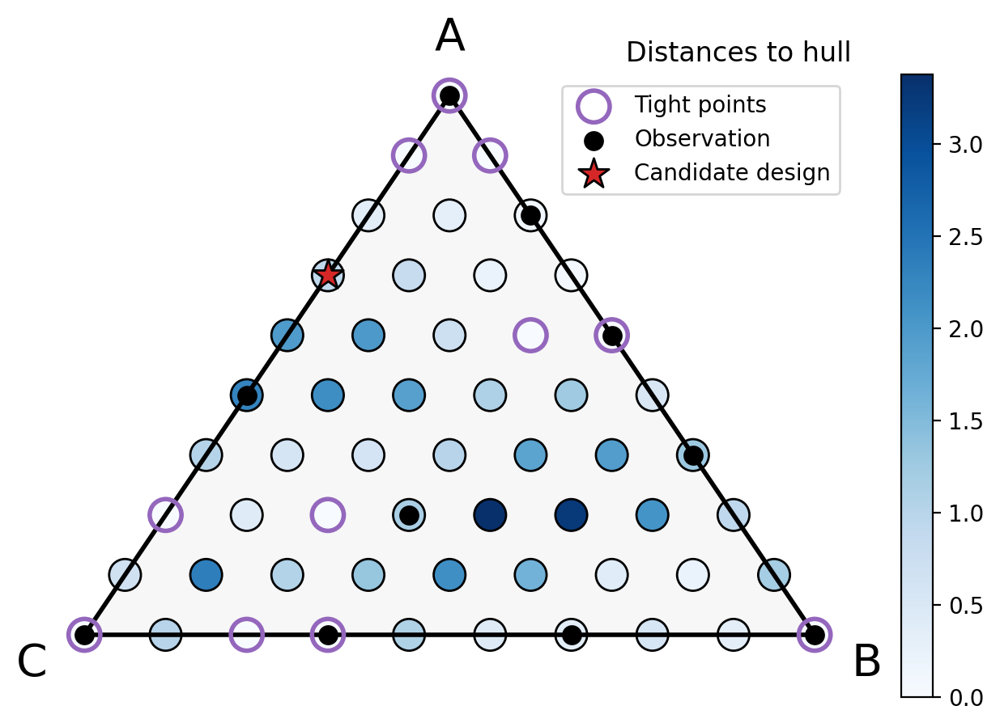

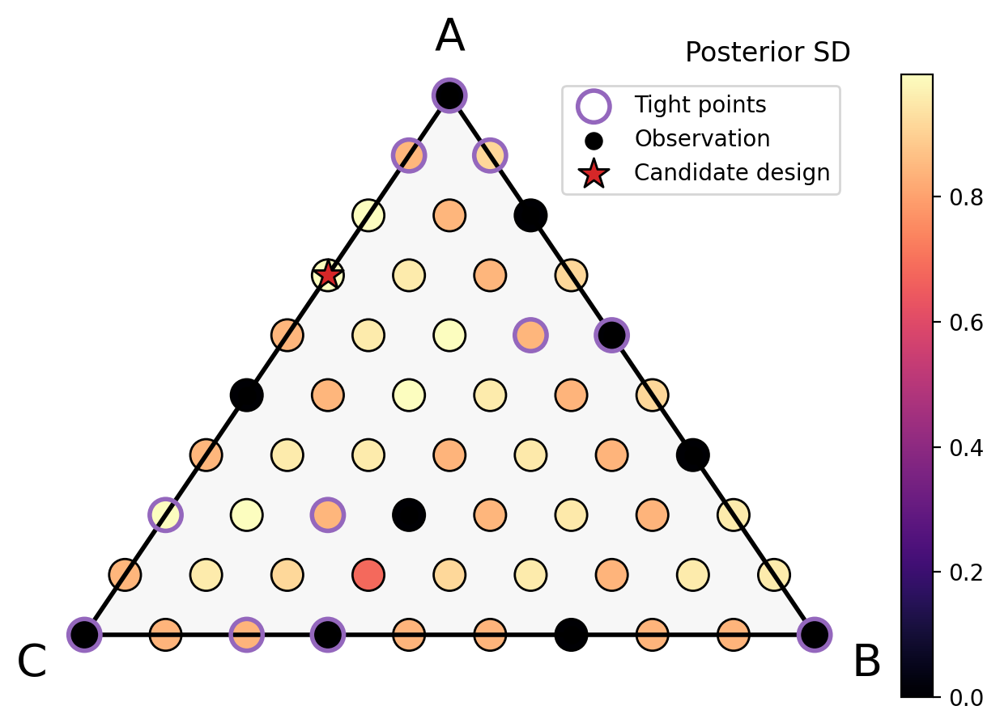

Number of tight points after observing candidate:  5
Iteration:  9
CPU times: user 1.86 s, sys: 13.2 ms, total: 1.87 s
Wall time: 1.87 s


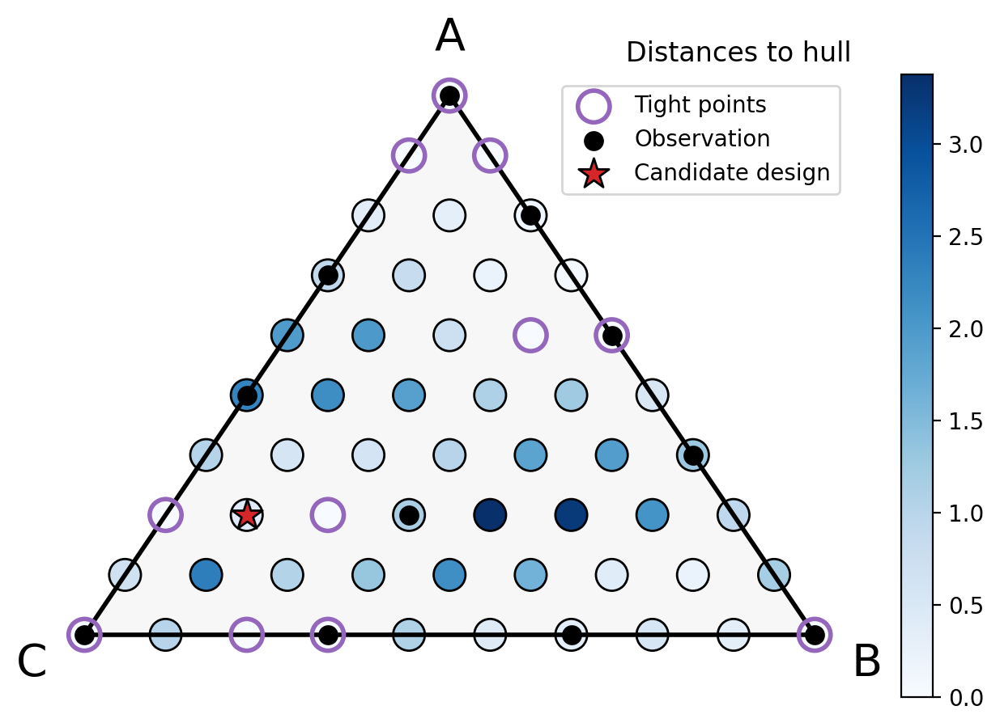

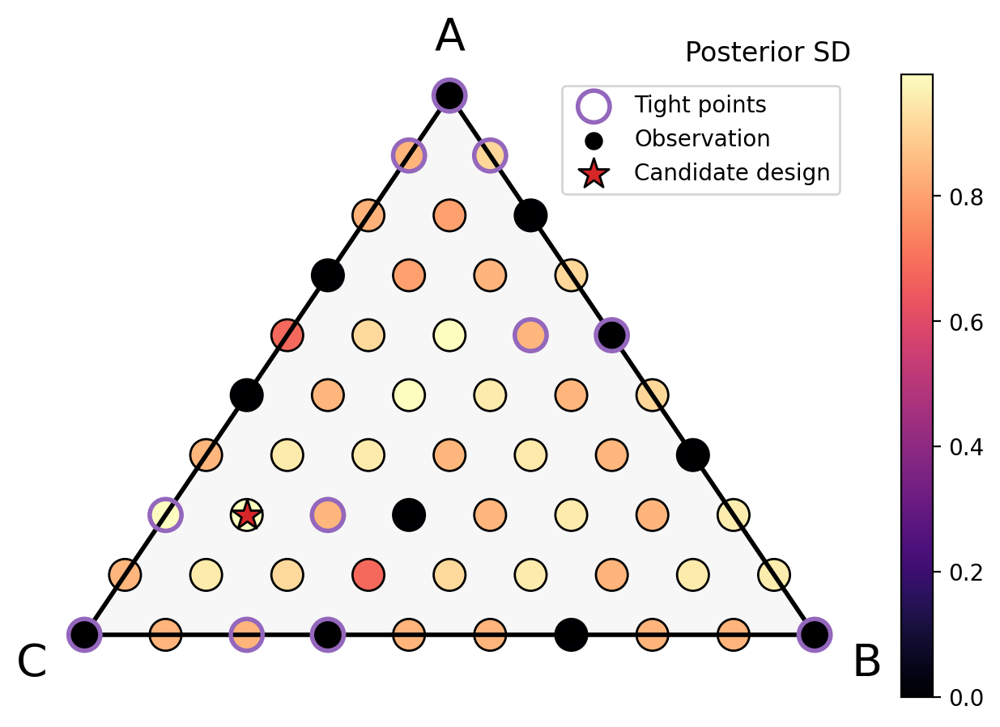

Number of tight points after observing candidate:  5
Iteration:  10
CPU times: user 1.8 s, sys: 12.2 ms, total: 1.81 s
Wall time: 1.81 s


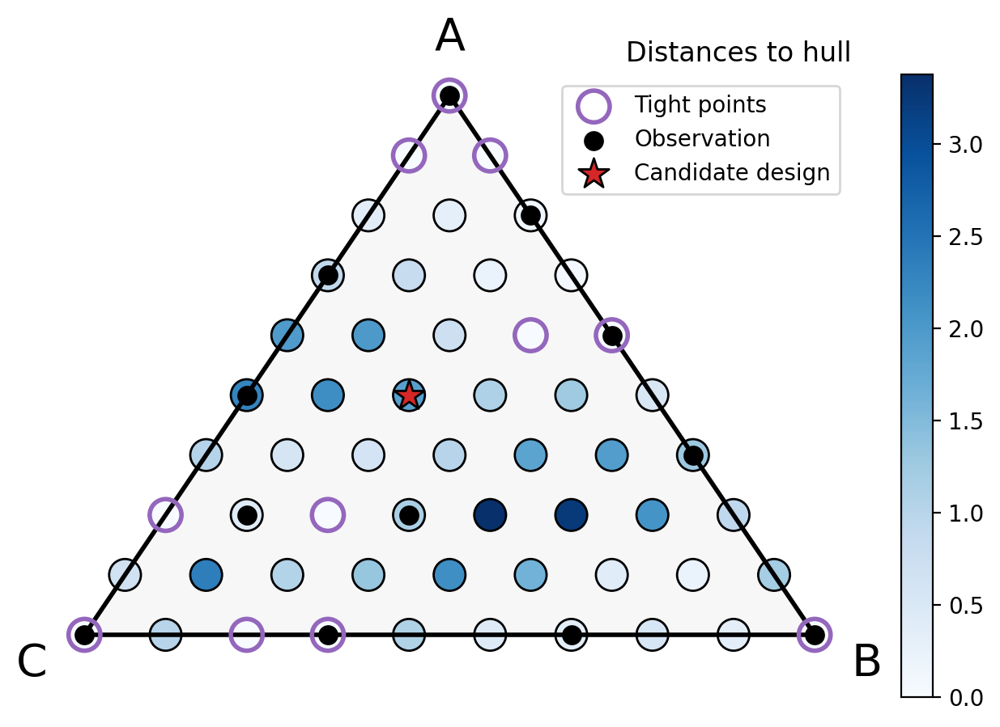

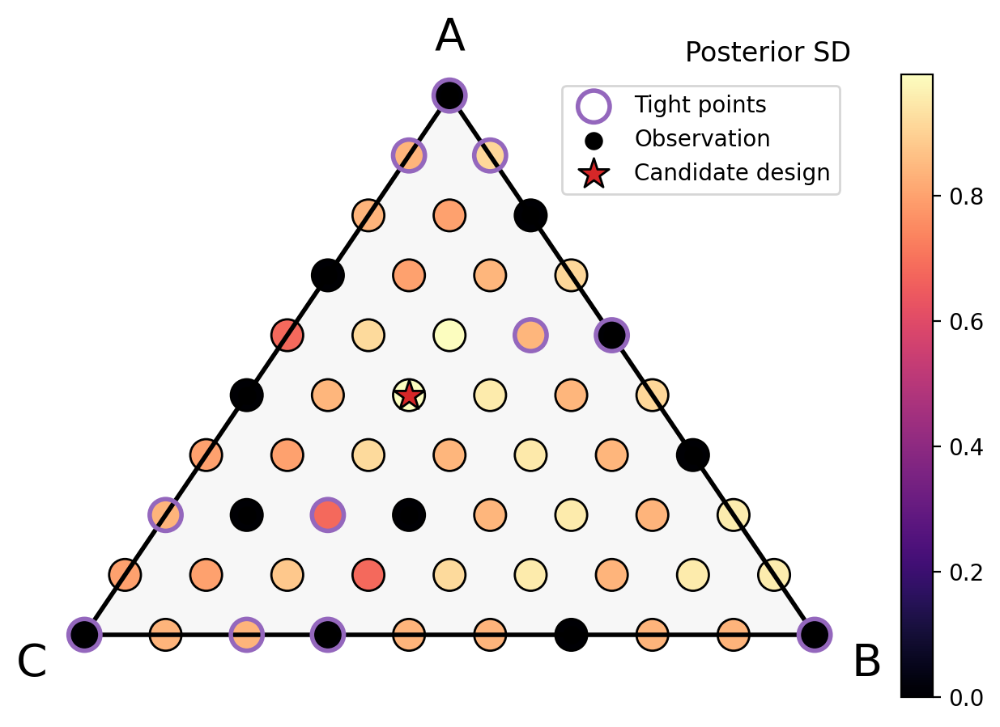

Number of tight points after observing candidate:  5
Iteration:  11
CPU times: user 1.85 s, sys: 17 ms, total: 1.87 s
Wall time: 1.88 s


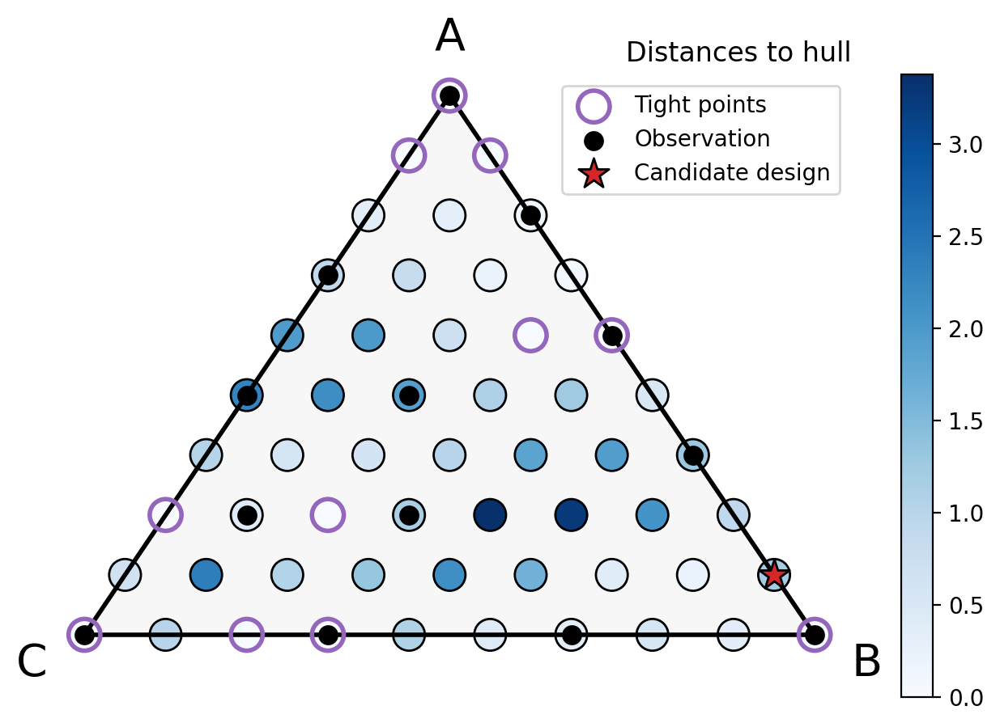

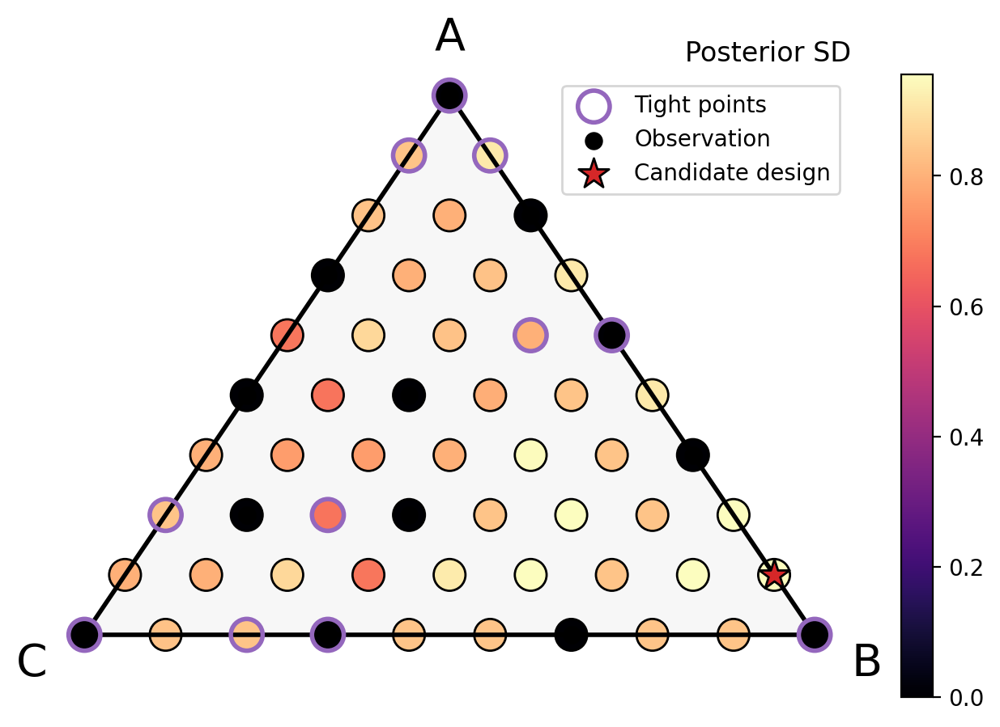

Number of tight points after observing candidate:  5
Iteration:  12
CPU times: user 1.76 s, sys: 13.7 ms, total: 1.77 s
Wall time: 1.77 s


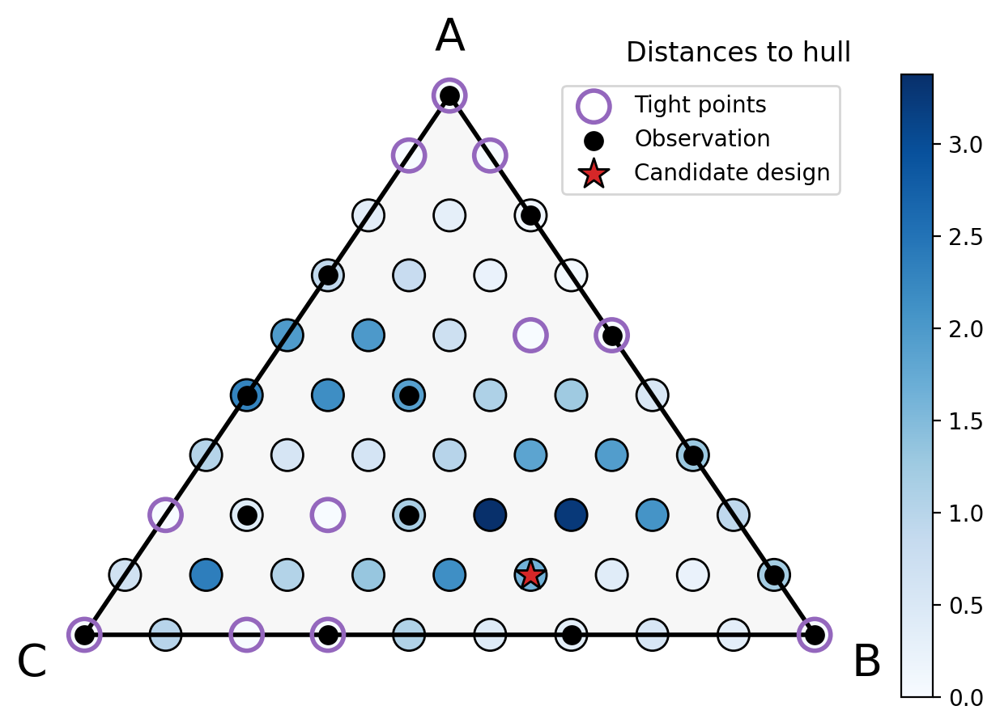

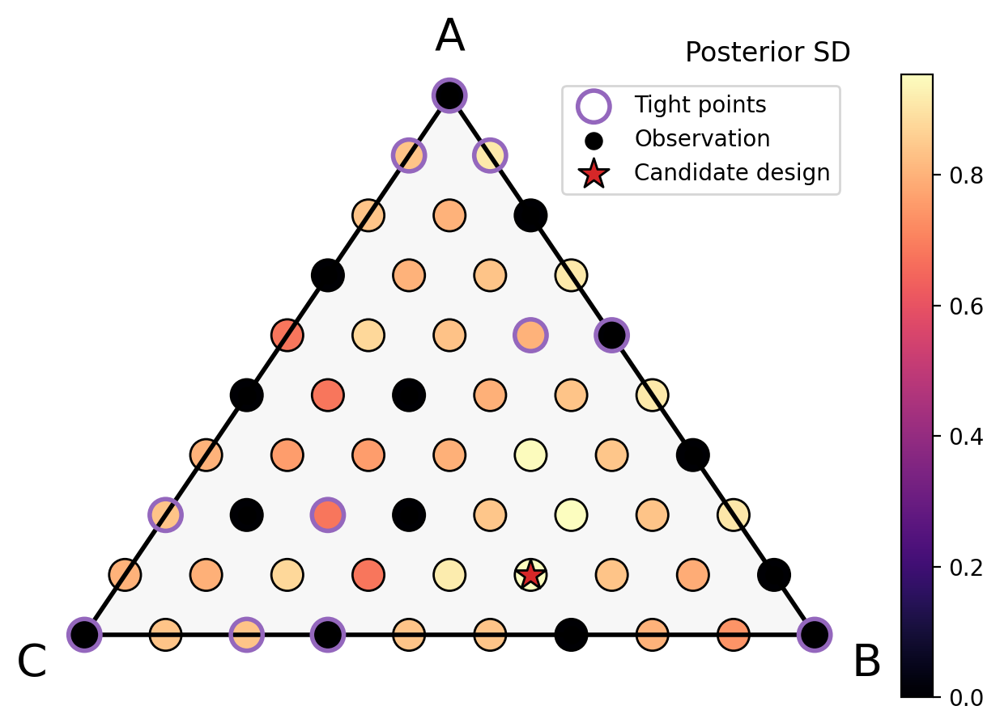

Number of tight points after observing candidate:  5
Iteration:  13
CPU times: user 1.74 s, sys: 14.3 ms, total: 1.75 s
Wall time: 1.76 s


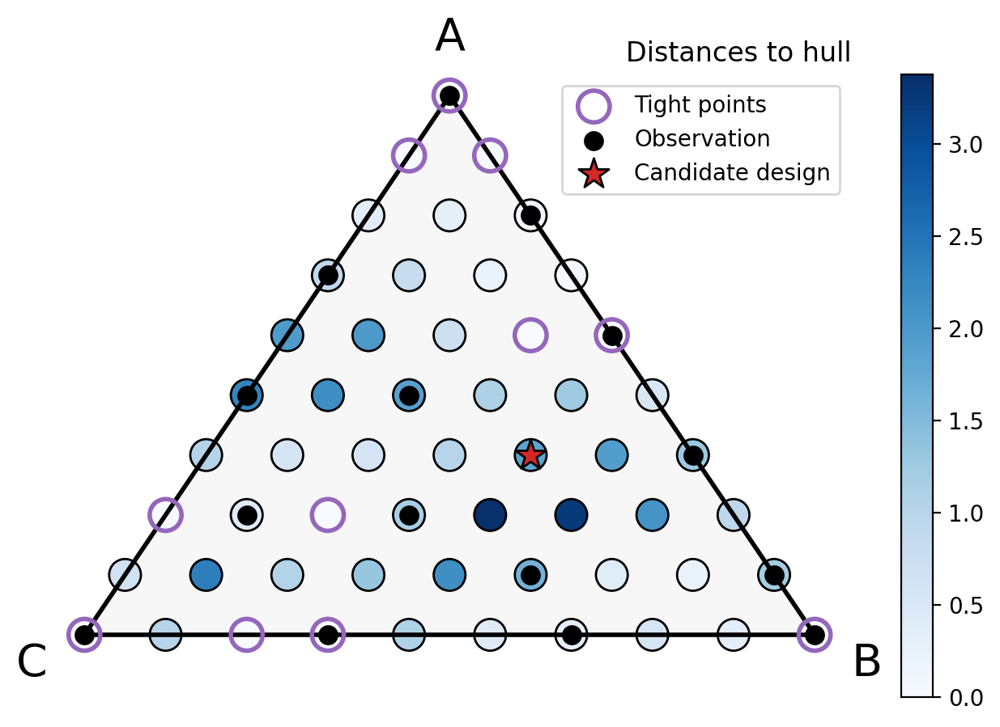

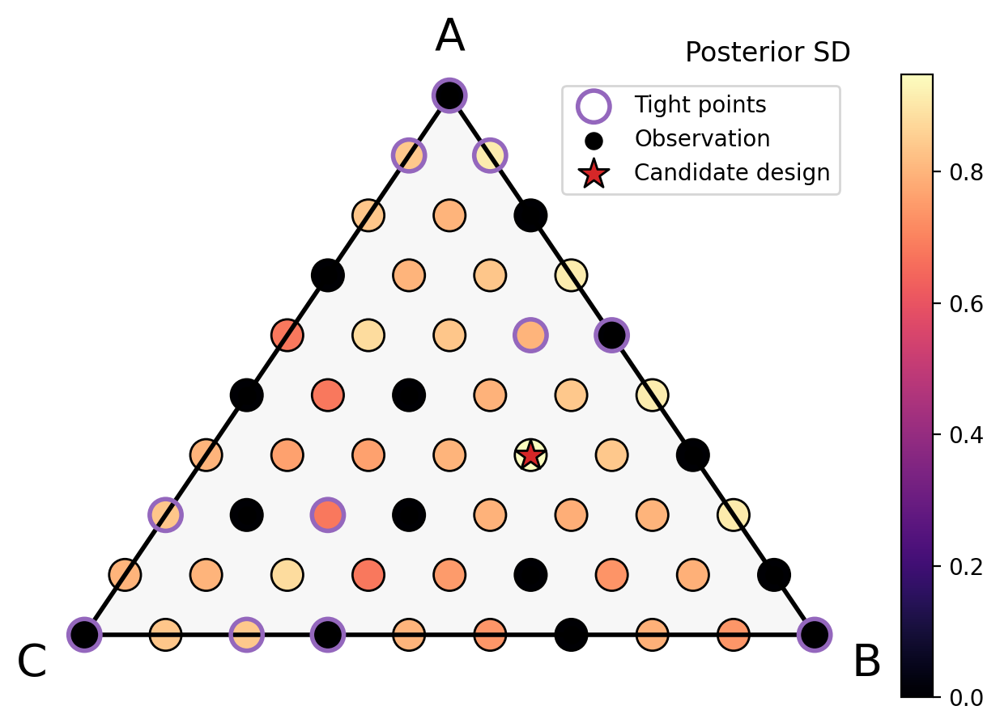

Number of tight points after observing candidate:  5
Iteration:  14
CPU times: user 1.69 s, sys: 11.8 ms, total: 1.7 s
Wall time: 1.7 s


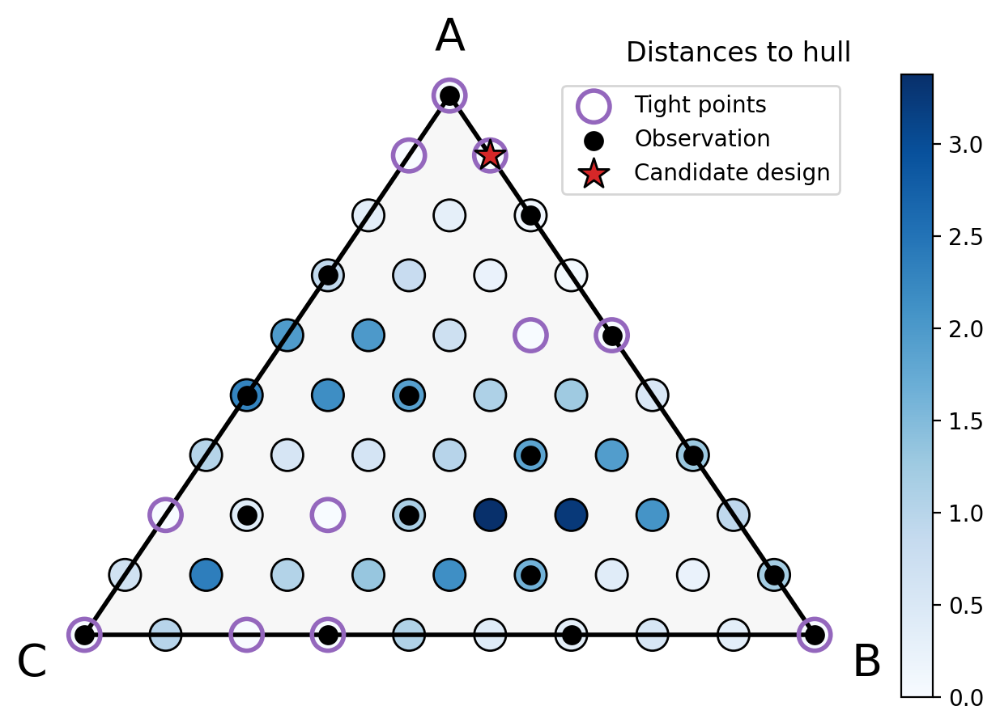

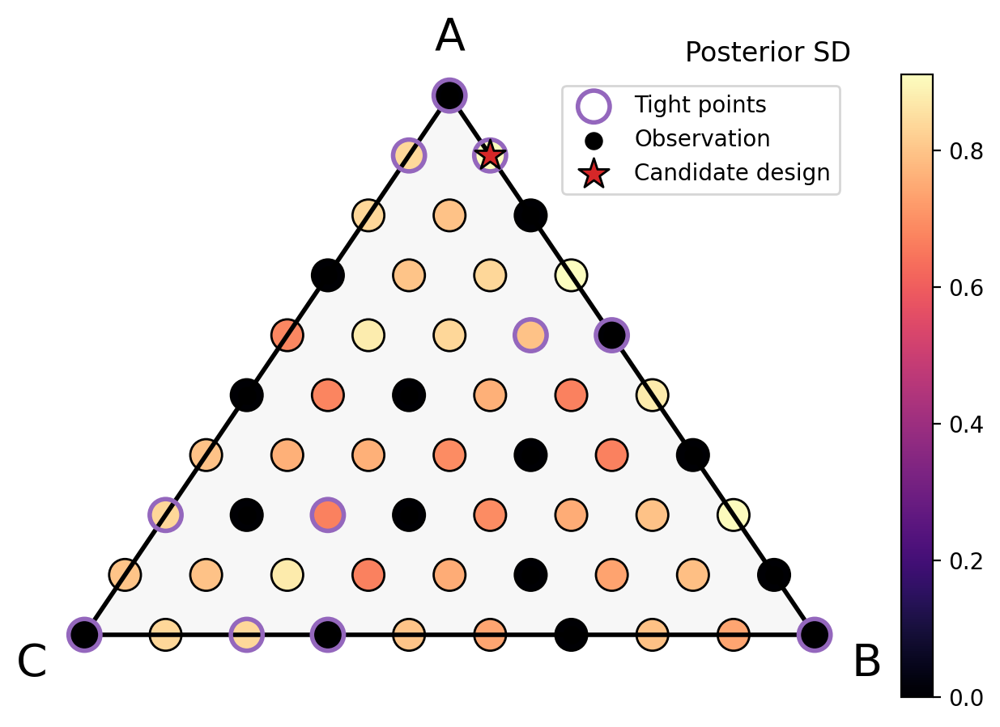

Number of tight points after observing candidate:  6


In [4]:
## baseline

num_iters = 15

dataset = Dataset(X=train_x, y=train_y[:,jnp.newaxis])
designs = design_space[1:-1]

# Update the model given the data above
pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)
num_tights = 2; tights_baseline = [num_tights]

for i in range(num_iters):
    
    print("Iteration: ", i)    
    # get candidate design
    %time next_x, entropy_change = get_next_candidate_baseline(posterior, params, dataset, designs, design_space)
    # get the index of candidate w.r.t. full design space
    next_x_ind = (design_space == next_x).sum(1).argmax()

    # plot distances
    plot_distances(pts, true_y, true_envelope, dataset, next_x=next_x_ind, scale=10, tight_pts=tight_pts, plot_design=False, plot_title=True)
    # plot posterior std
    plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid*10, plot_title=True, plot_design=False)
    
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
    designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)
    
    pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)
    
    # Print # of tight points found
    y_ind = (true_y == float(true_y[next_x_ind])).argmax()
    if tights.ravel()[int(y_ind)]:
        num_tights += 1
    print("Number of tight points after observing candidate: ", num_tights)
    tights_baseline.append(num_tights)

# Convex-hull-aware active search

Current status: it's way too slow as is.

TODO:
* Speed up code

Iteration:  0
CPU times: user 30min 17s, sys: 12.8 s, total: 30min 30s
Wall time: 18min 39s


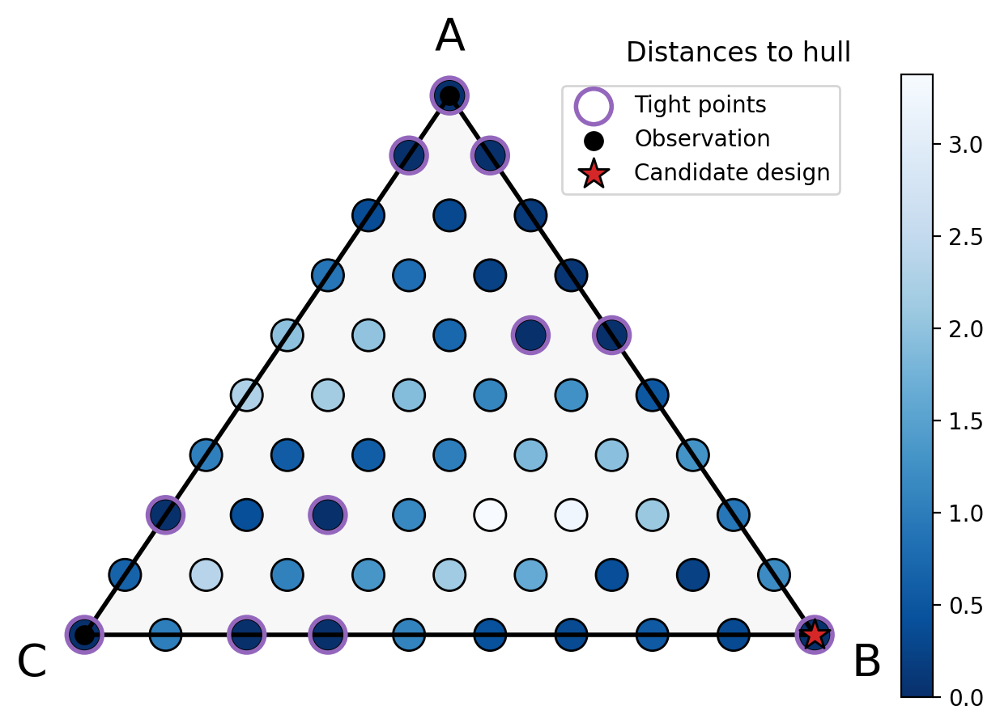

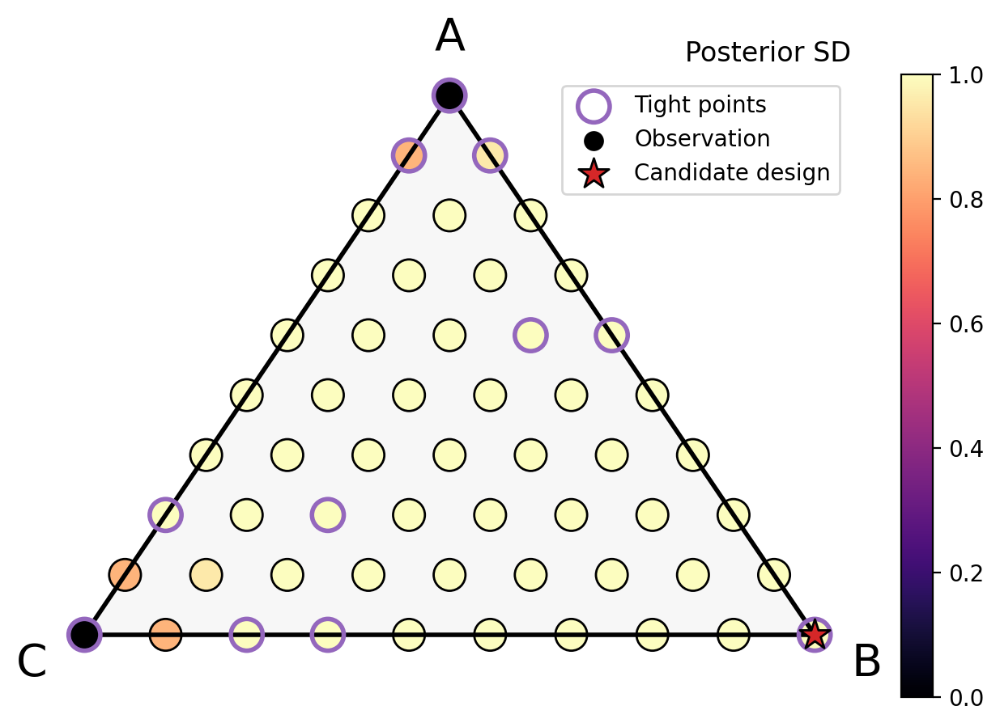

Iteration:  1
CPU times: user 28min 51s, sys: 7.63 s, total: 28min 58s
Wall time: 17min 26s


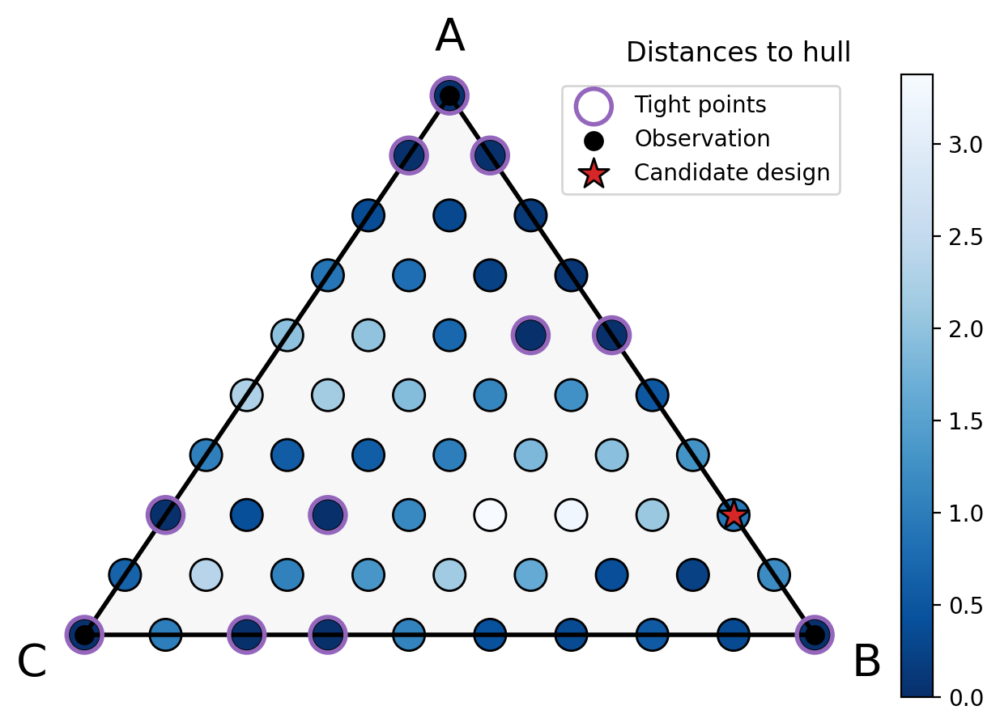

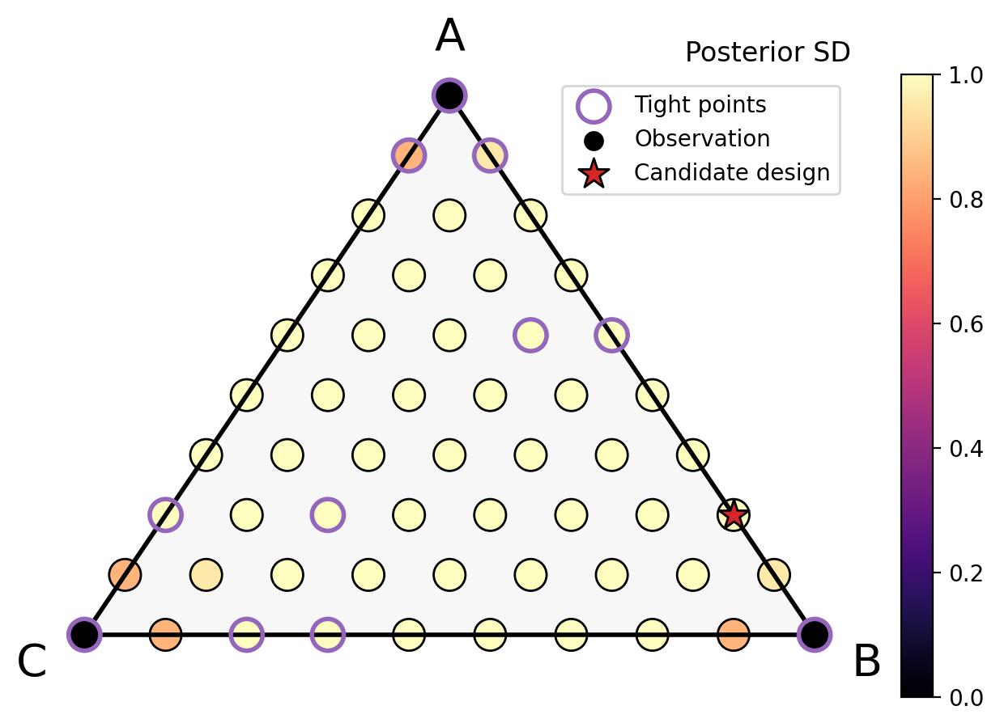

Iteration:  2
CPU times: user 33min 15s, sys: 15.2 s, total: 33min 30s
Wall time: 20min 36s


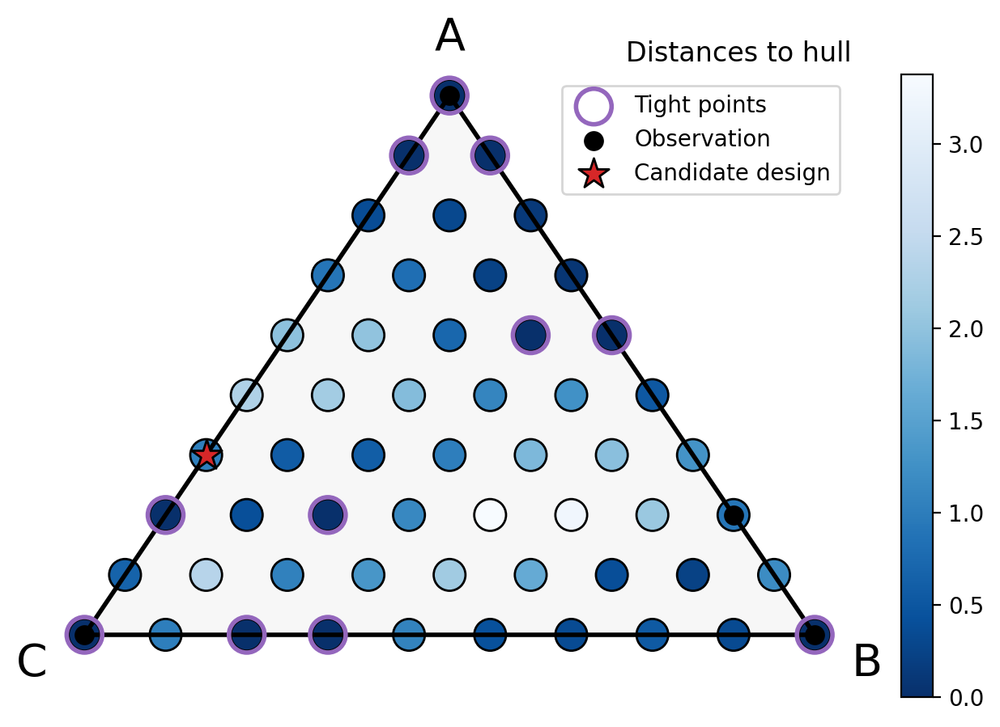

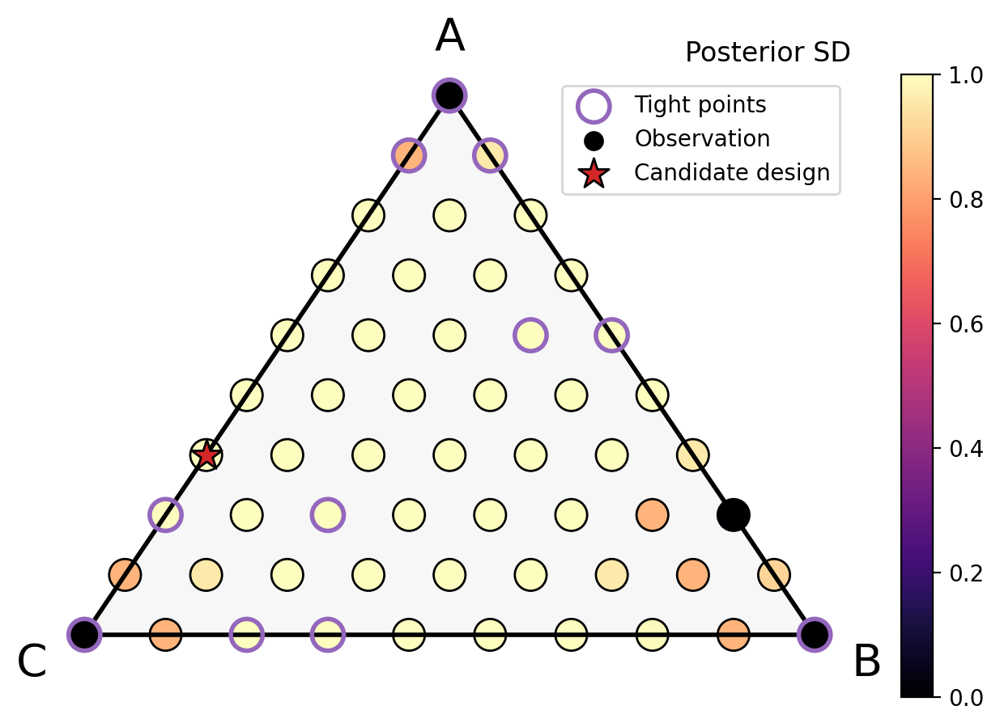

Iteration:  3
CPU times: user 36min 39s, sys: 16.7 s, total: 36min 56s
Wall time: 22min 54s


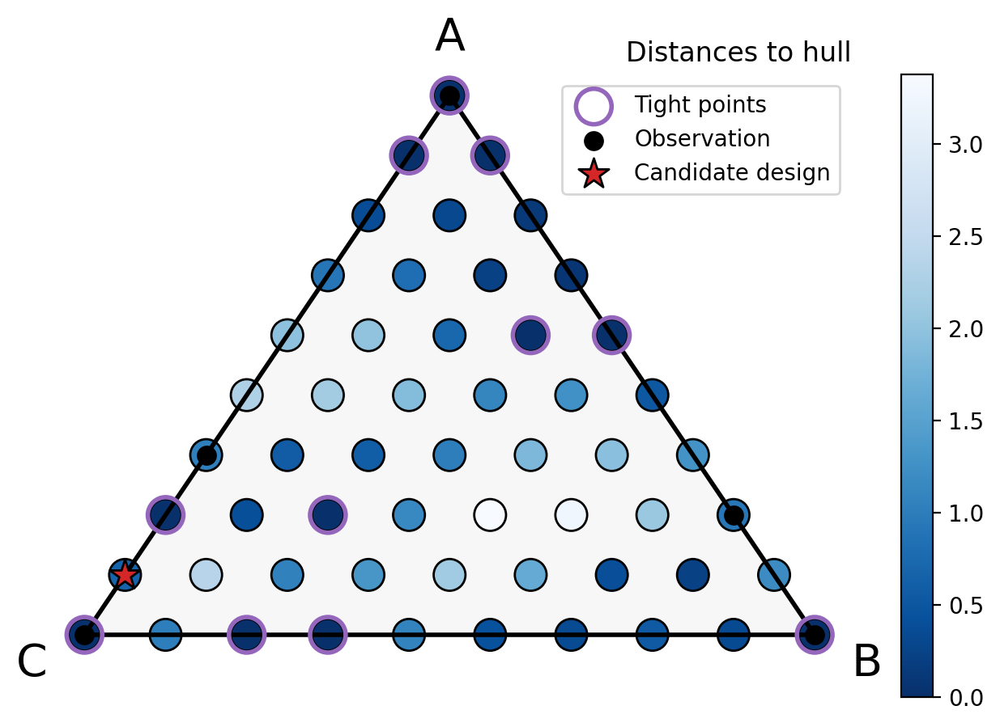

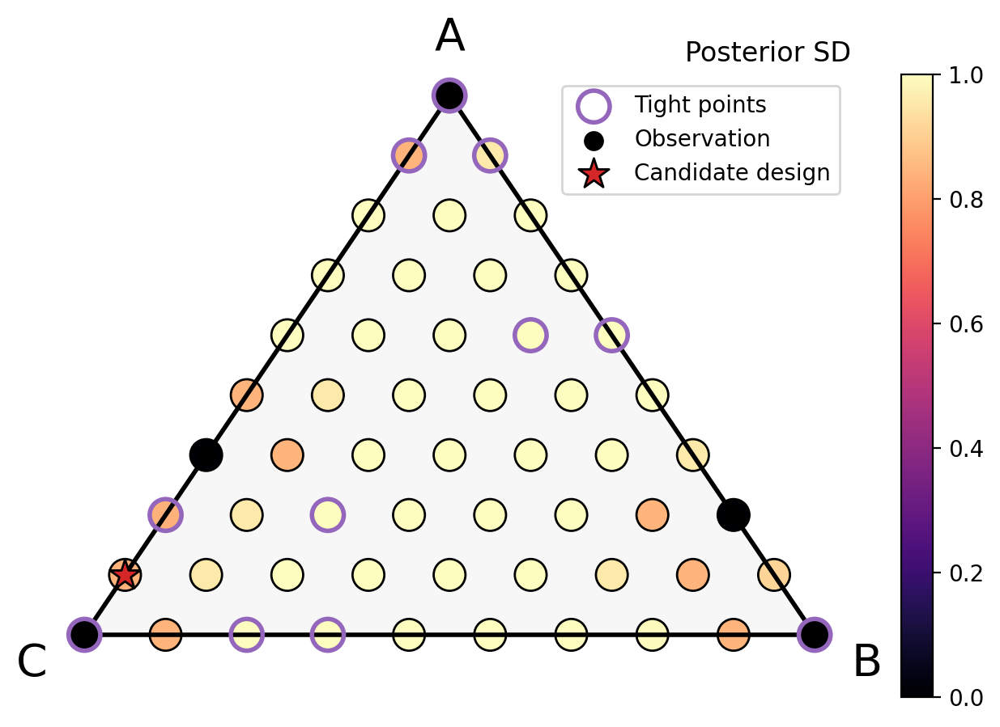

Iteration:  4
CPU times: user 40min 38s, sys: 15.6 s, total: 40min 54s
Wall time: 25min


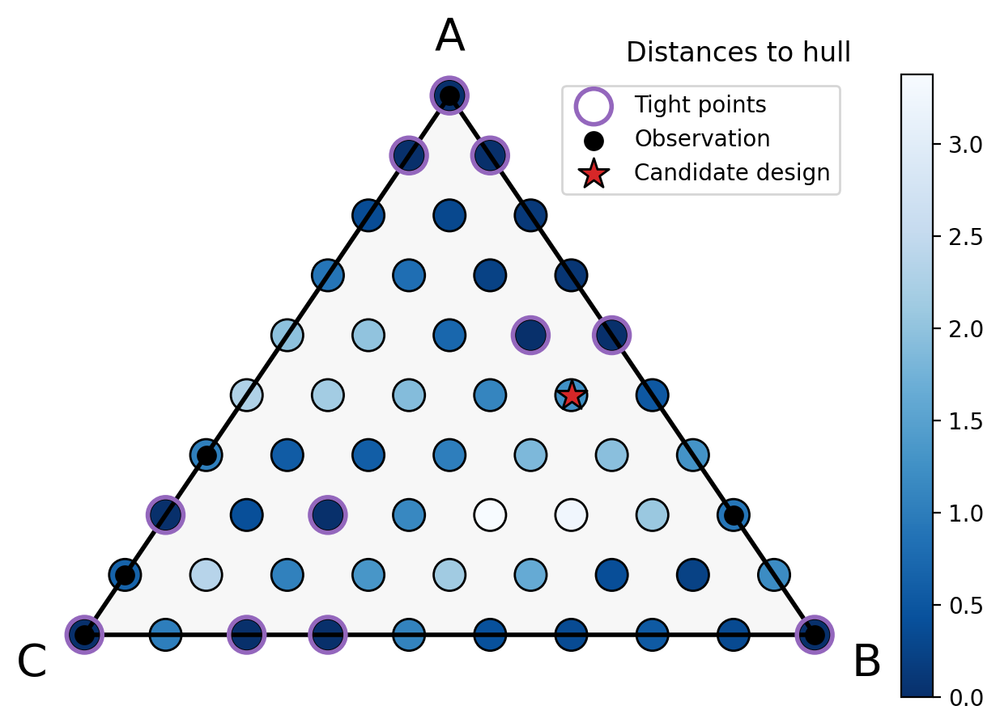

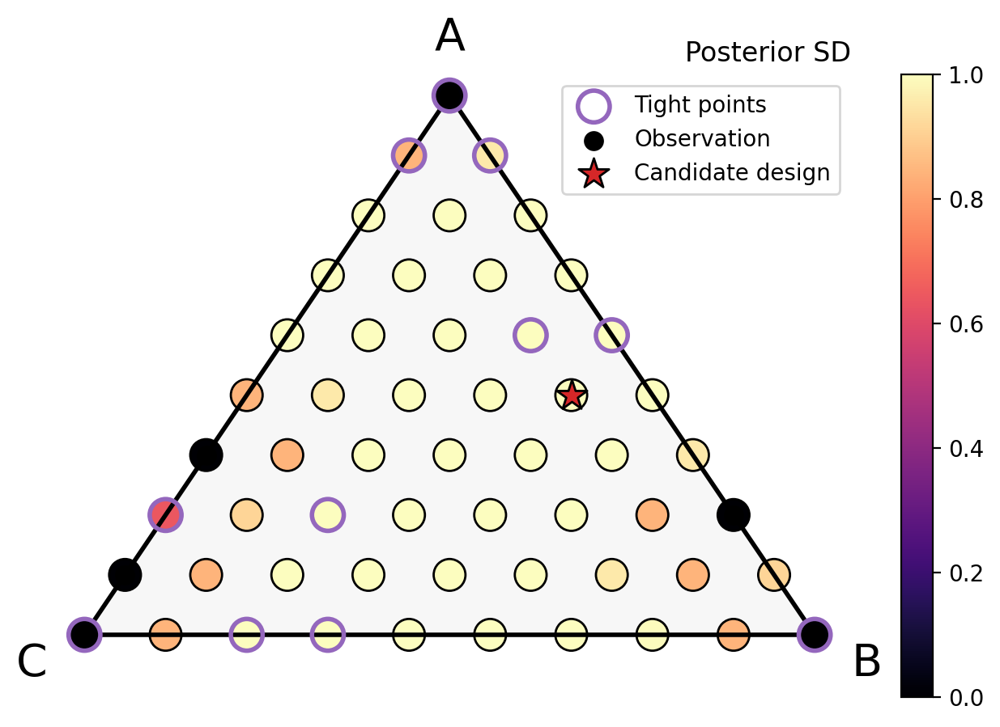

Iteration:  5
CPU times: user 45min 3s, sys: 30.6 s, total: 45min 34s
Wall time: 29min 32s


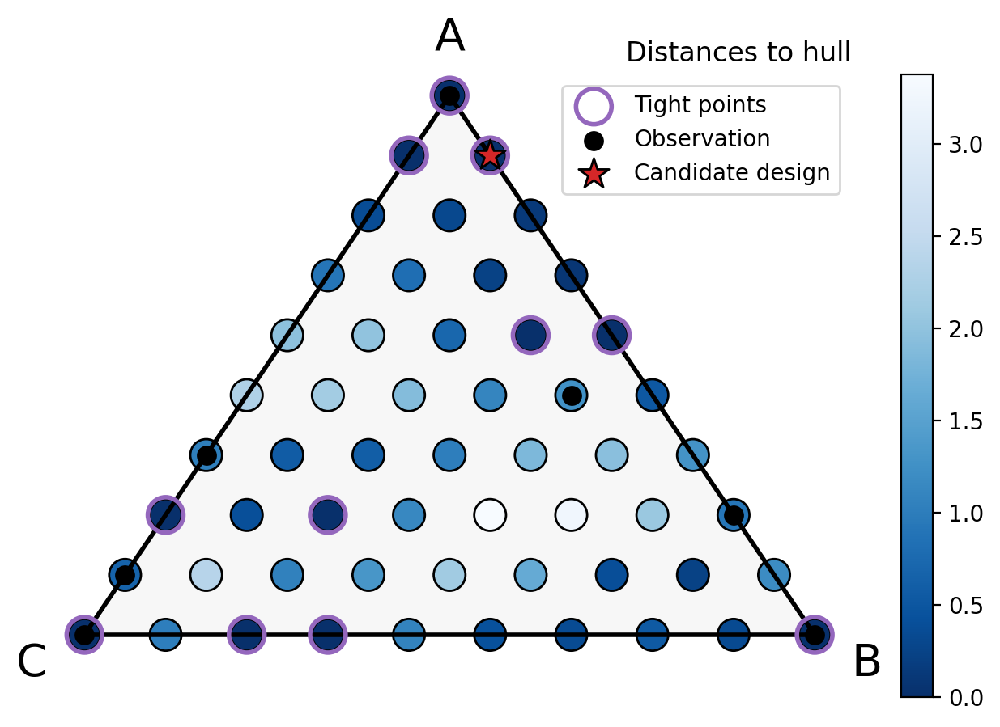

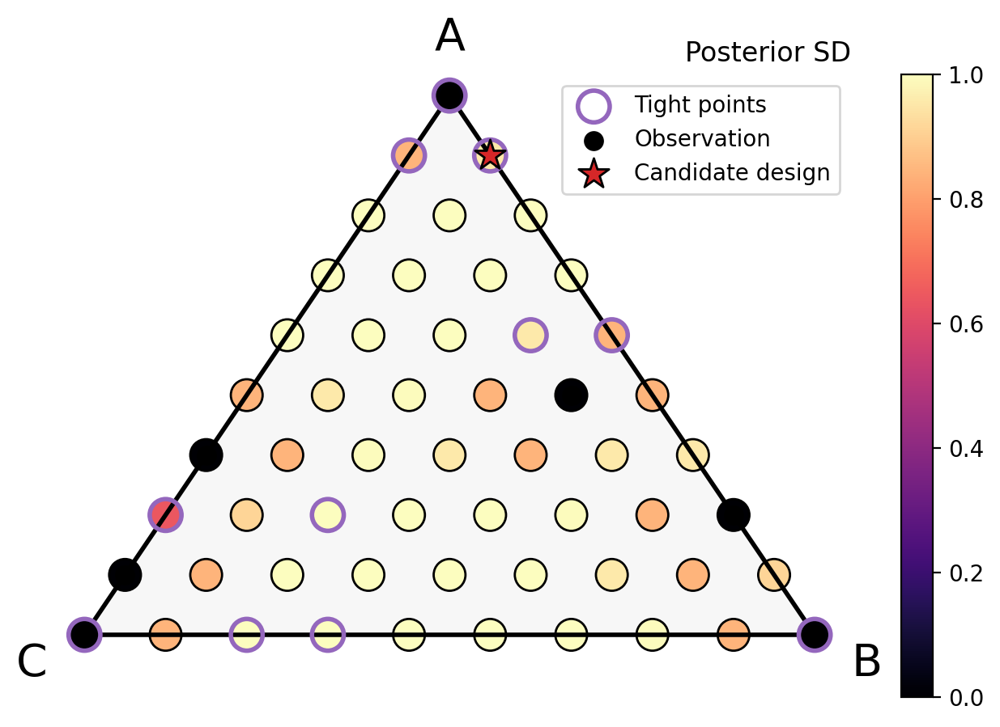

In [44]:
npr.seed(10); rng_key = jrnd.PRNGKey(1)

num_iters = 6

dataset = Dataset(X=train_x, y=train_y[:,jnp.newaxis])
designs = design_space[1:-1]

# Update the model given the data above
pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)

for i in range(num_iters):
    
    print("Iteration: ", i)    
    # get candidate design
    %time next_x, entropy_change = get_next_candidate(posterior, params, dataset, designs, design_space, rng_key, T=15, J=20)
    # get the index of candidate w.r.t. full design space
    next_x_ind = (design_space == next_x).sum(1).argmax()

    # plot posterior std
    plot_distances(pts, true_y, true_envelope, next_x=next_x_ind, scale=n_grid, tight_pts=tight_pts, plot_design=False, plot_title=True)
    plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid, plot_title=True, plot_design=False)
    
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
    designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)
    
    pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)

#distances = []; distances.append(compute_distances(dataset, design_space, true_envelope))

Iteration:  6
CPU times: user 32min 33s, sys: 20.5 s, total: 32min 53s
Wall time: 19min 46s


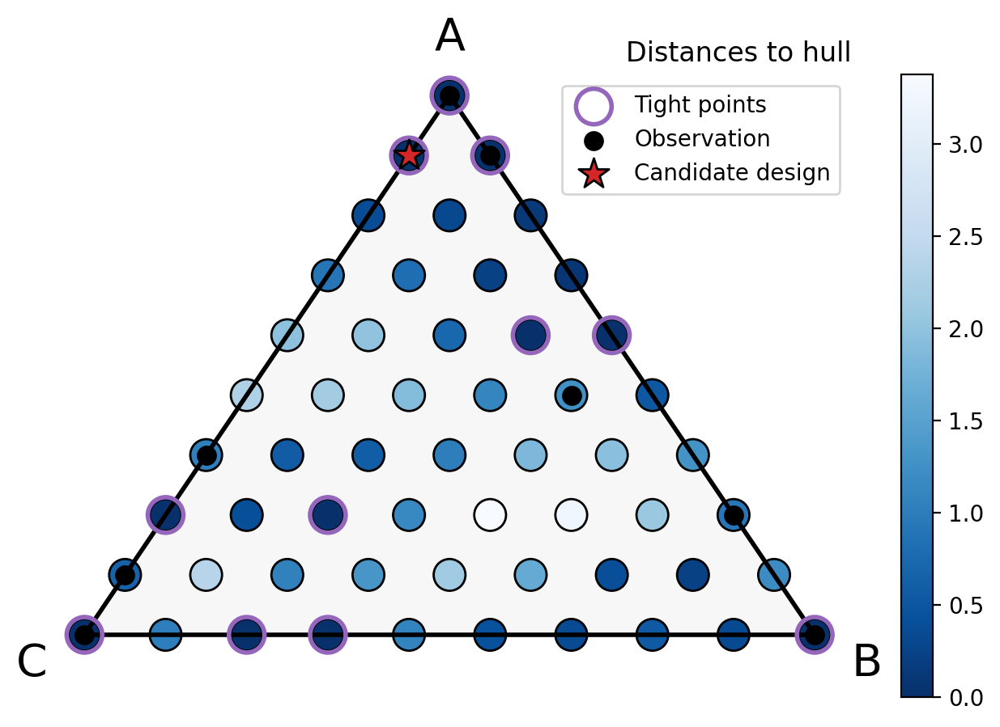

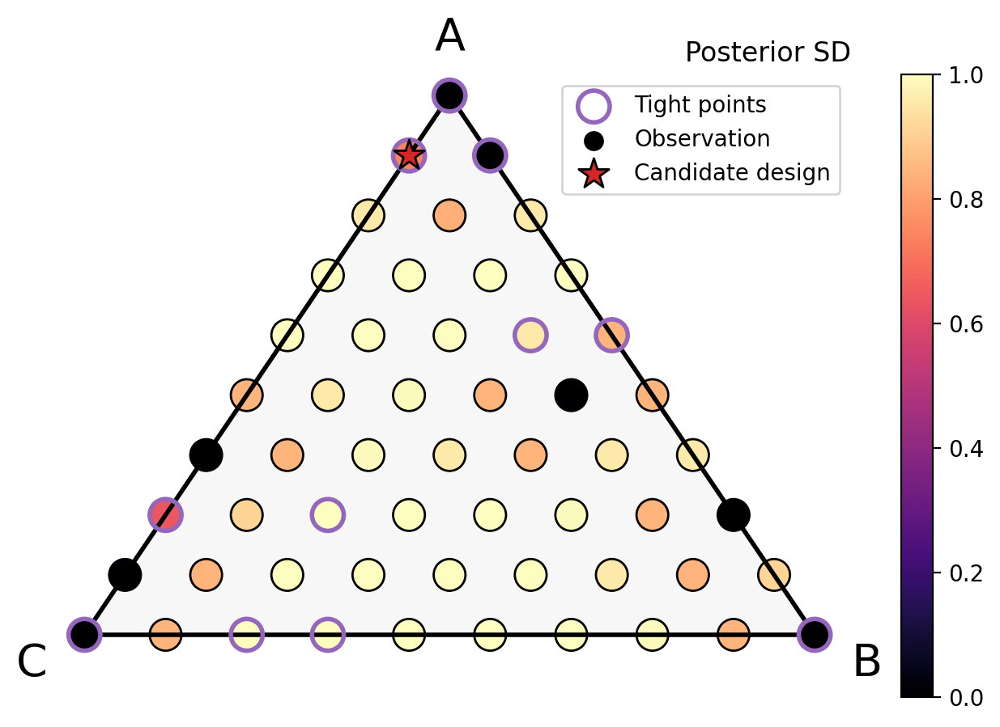

Iteration:  7
CPU times: user 31min 17s, sys: 16.1 s, total: 31min 33s
Wall time: 19min 9s


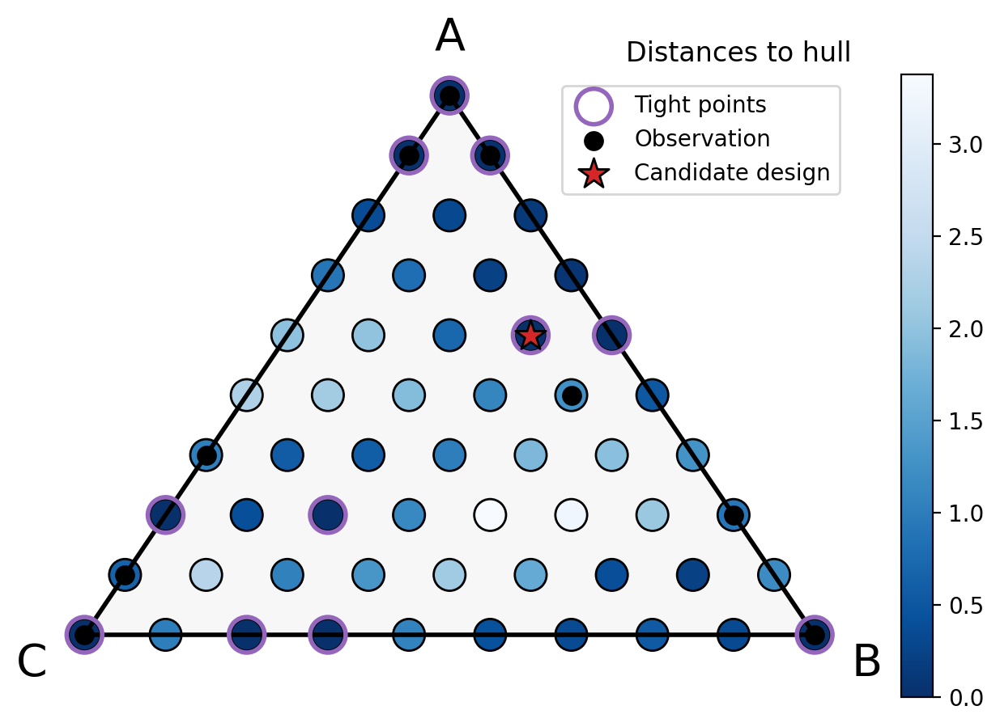

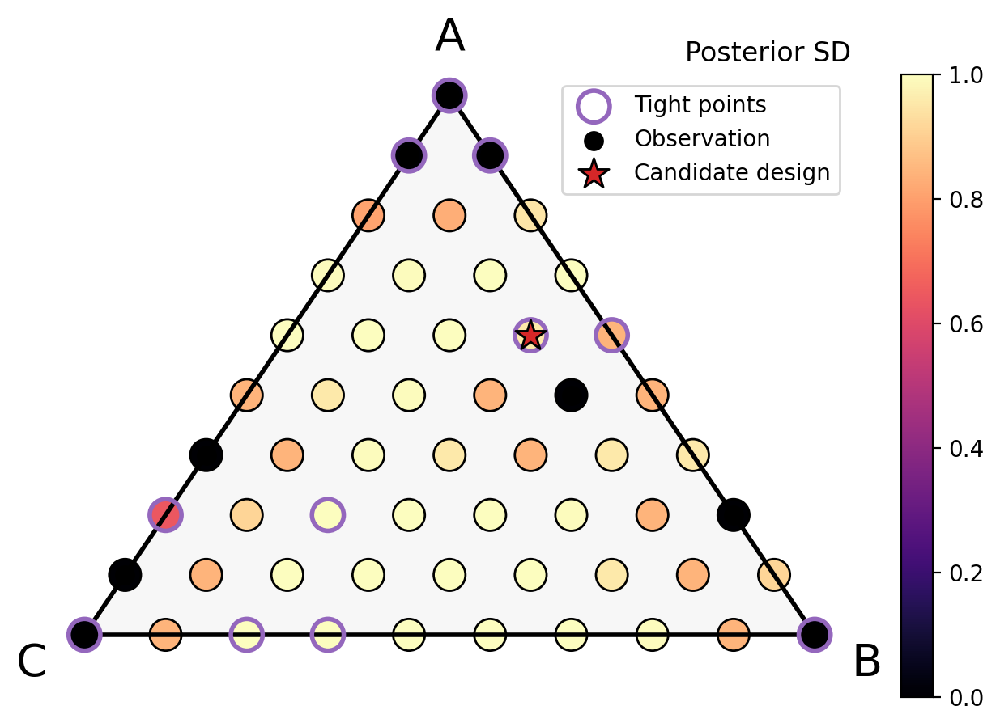

Iteration:  8
CPU times: user 26min 54s, sys: 4.62 s, total: 26min 59s
Wall time: 16min 8s


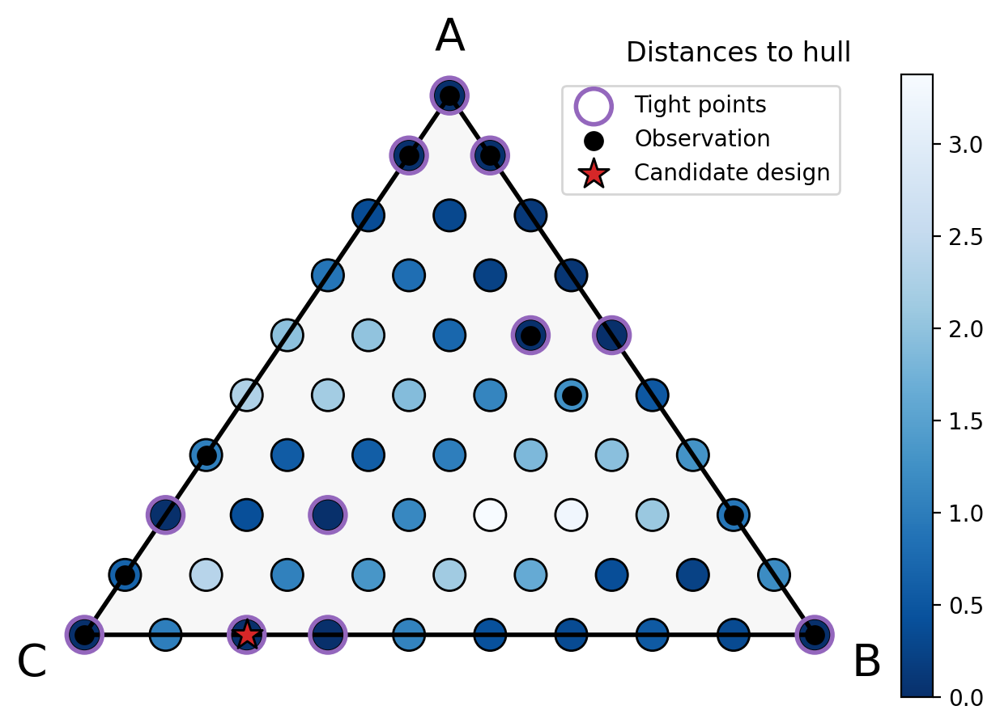

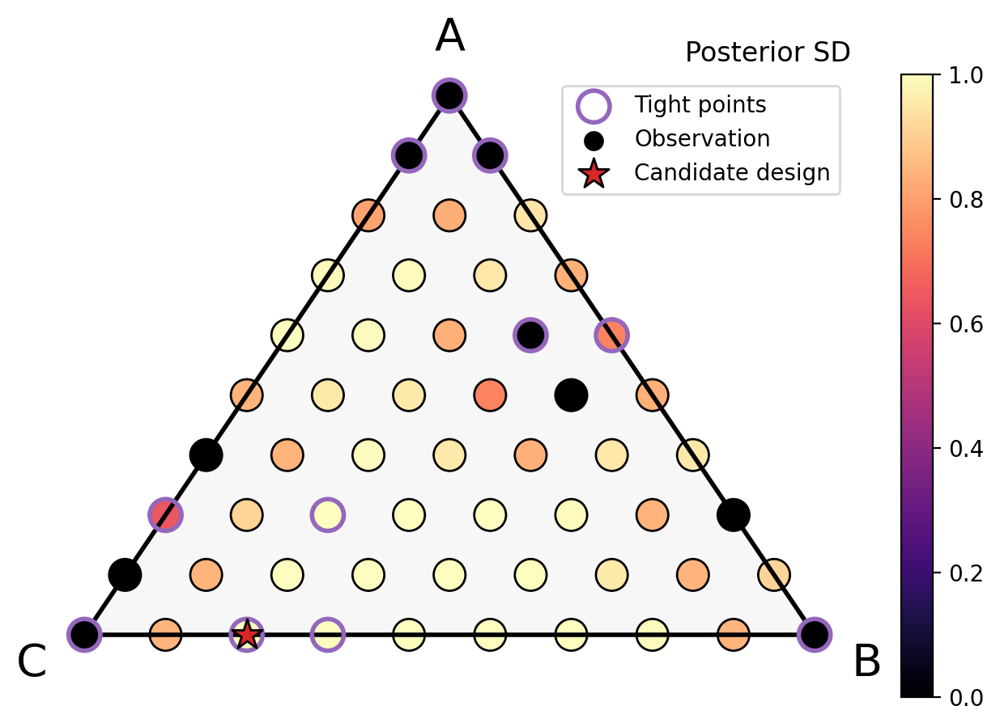

In [45]:
for i in range(3):
    
    print("Iteration: ", i+6)    
    # get candidate design
    %time next_x, entropy_change = get_next_candidate(posterior, params, dataset, designs, design_space, rng_key, T=15, J=20)
    # get the index of candidate w.r.t. full design space
    next_x_ind = (design_space == next_x).sum(1).argmax()

    # plot posterior std
    plot_distances(pts, true_y, true_envelope, next_x=next_x_ind, scale=n_grid, tight_pts=tight_pts, plot_design=False, plot_title=True)
    plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid, plot_title=True, plot_design=False)
    
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
    designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)
    
    pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)

Iteration:  9
CPU times: user 30min 9s, sys: 20.2 s, total: 30min 29s
Wall time: 18min 50s


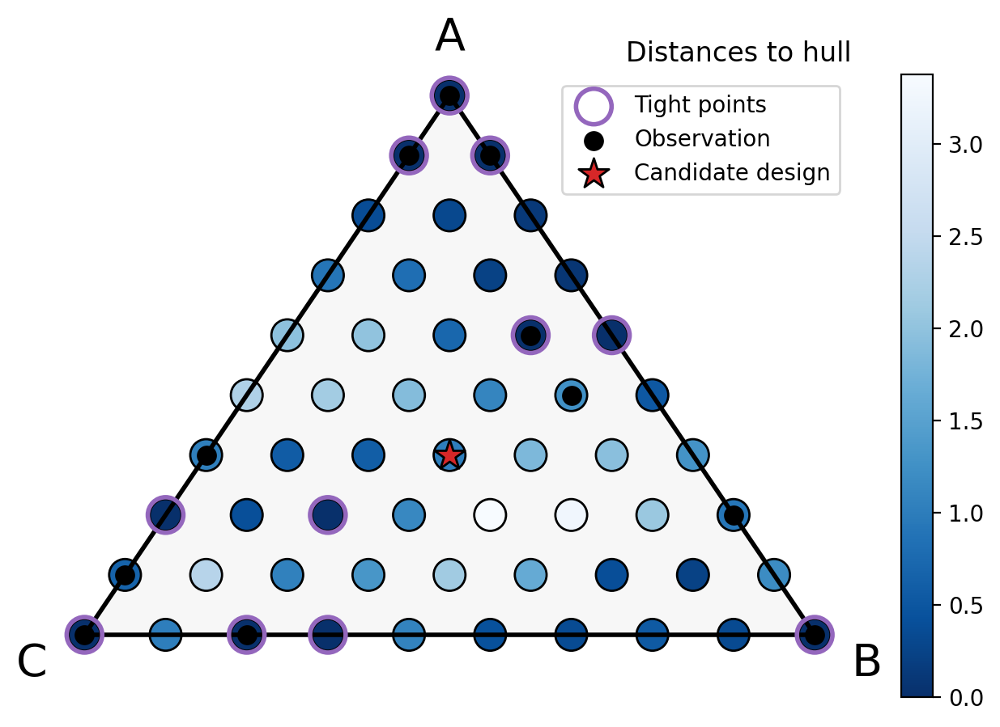

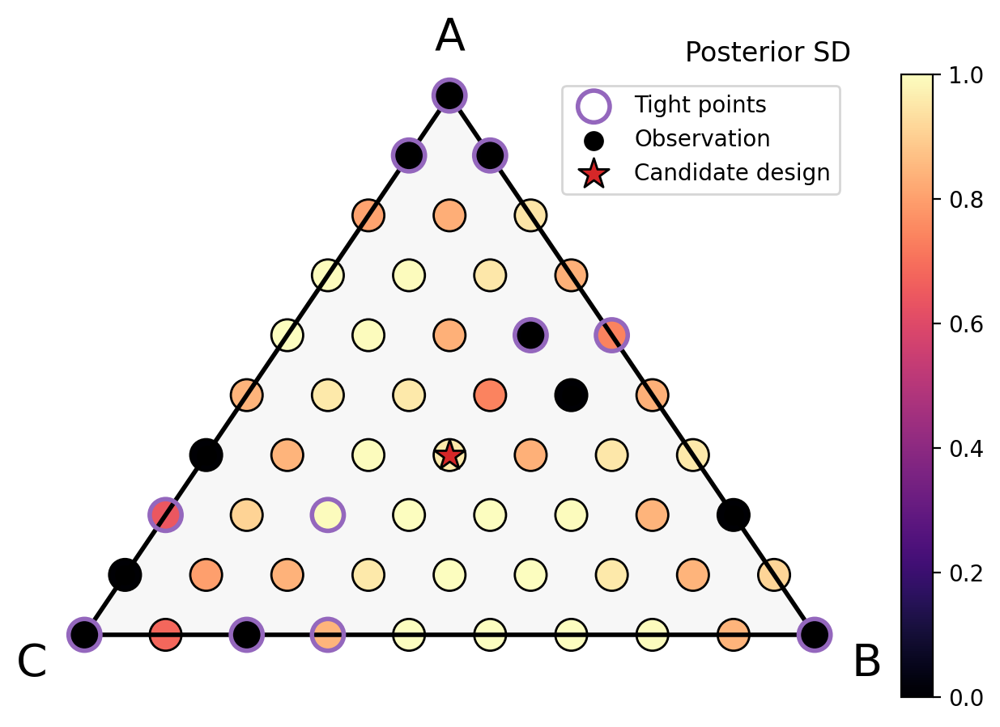

Iteration:  10
CPU times: user 27min 59s, sys: 12.3 s, total: 28min 11s
Wall time: 16min 58s


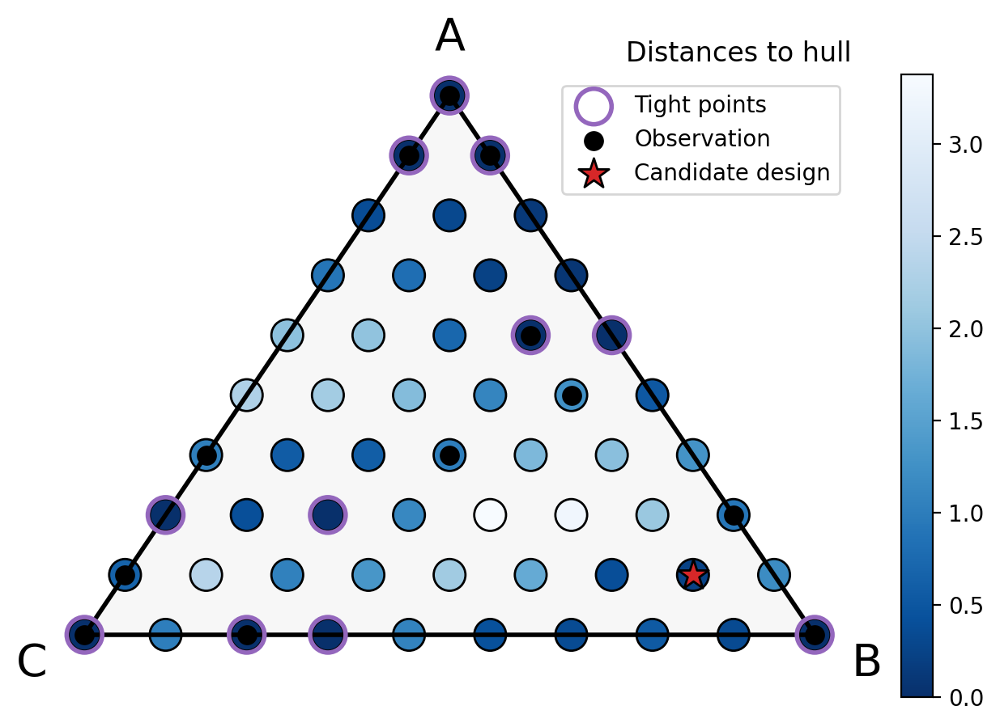

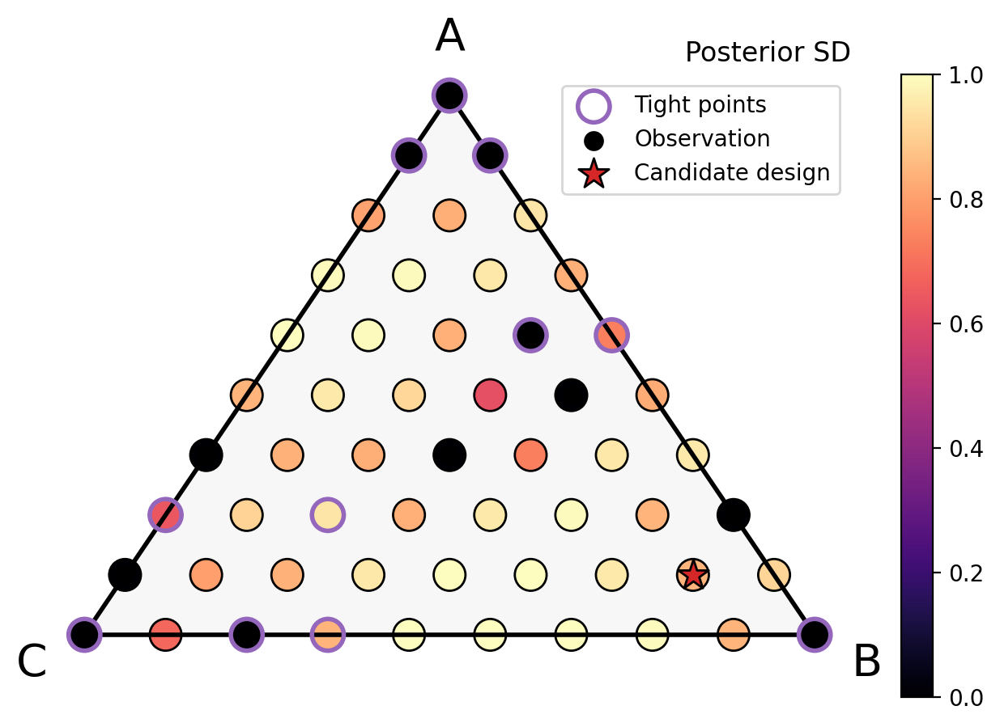

Iteration:  11
CPU times: user 27min 59s, sys: 11.8 s, total: 28min 10s
Wall time: 17min 9s


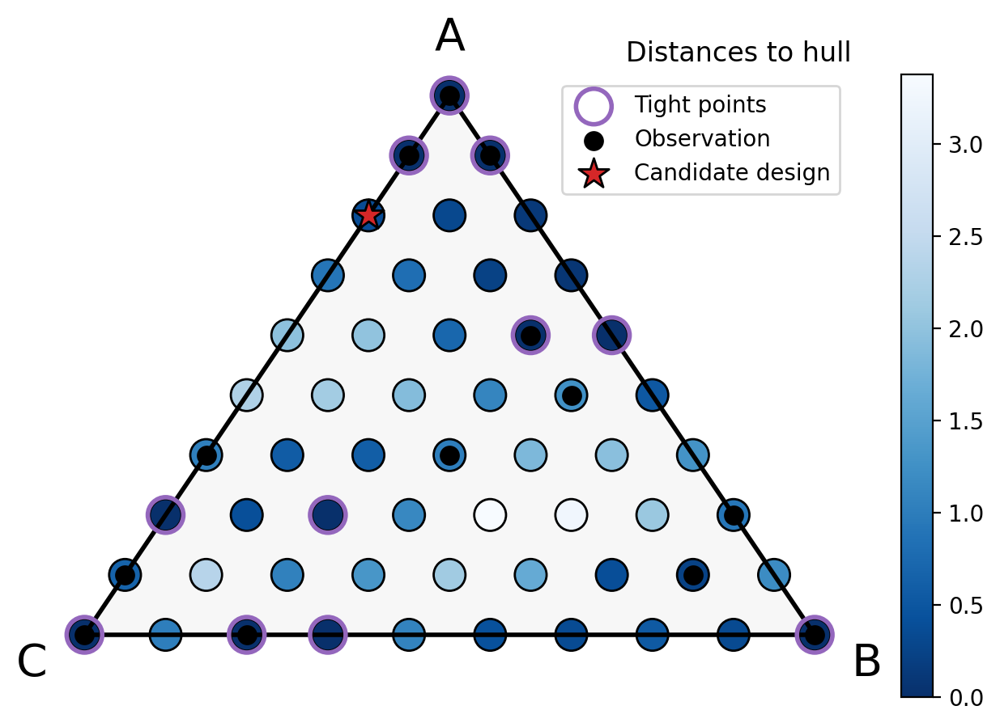

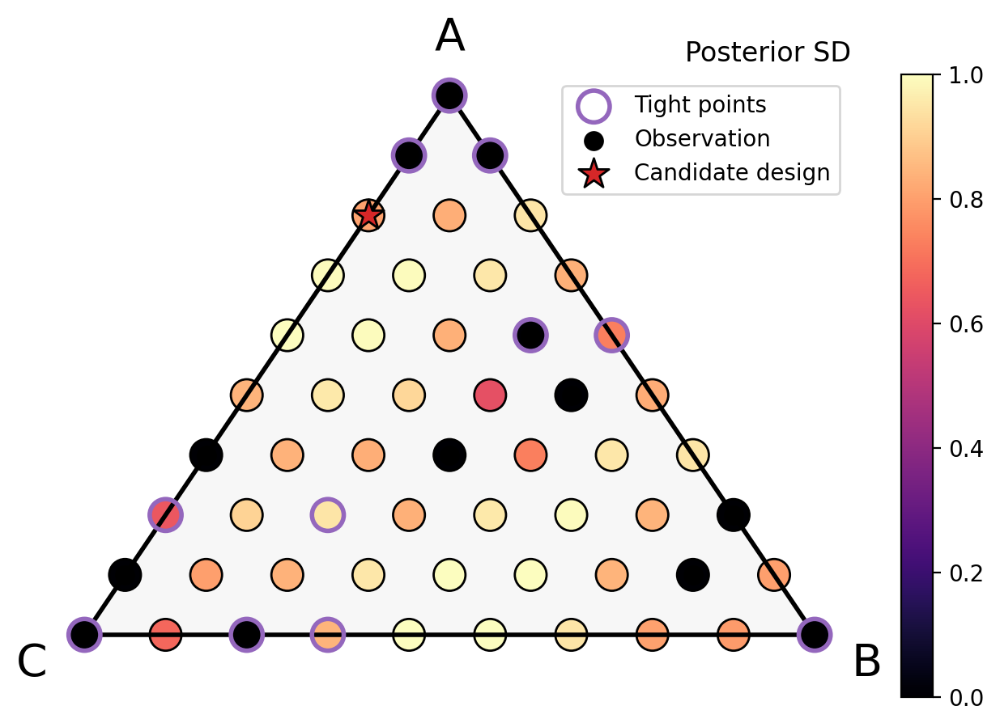

Iteration:  12
CPU times: user 29min 40s, sys: 17.7 s, total: 29min 57s
Wall time: 18min 27s


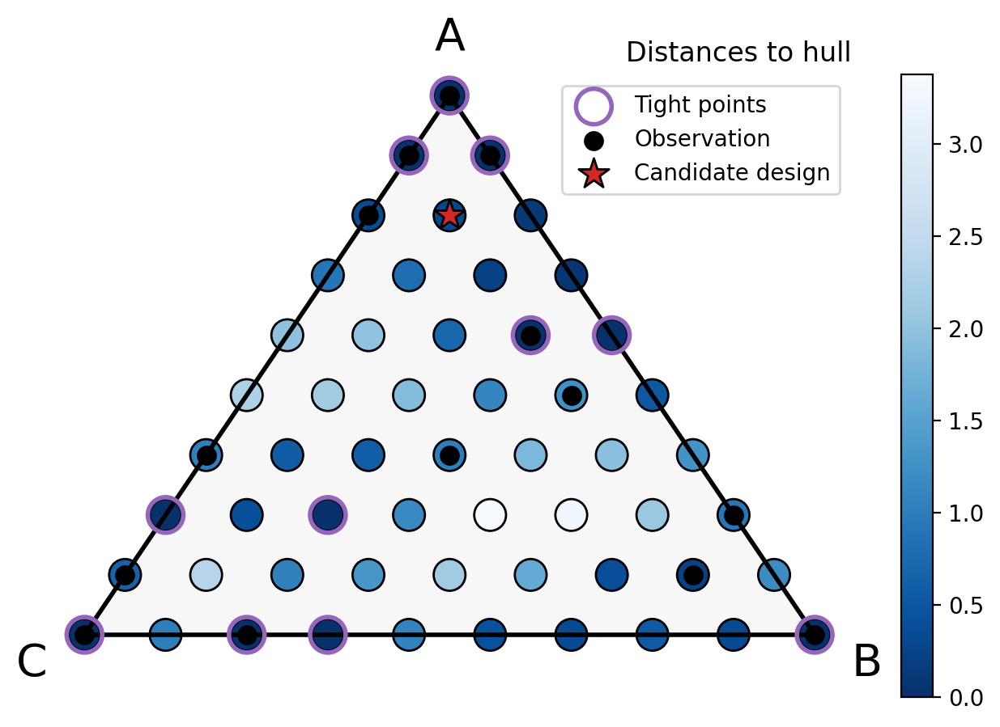

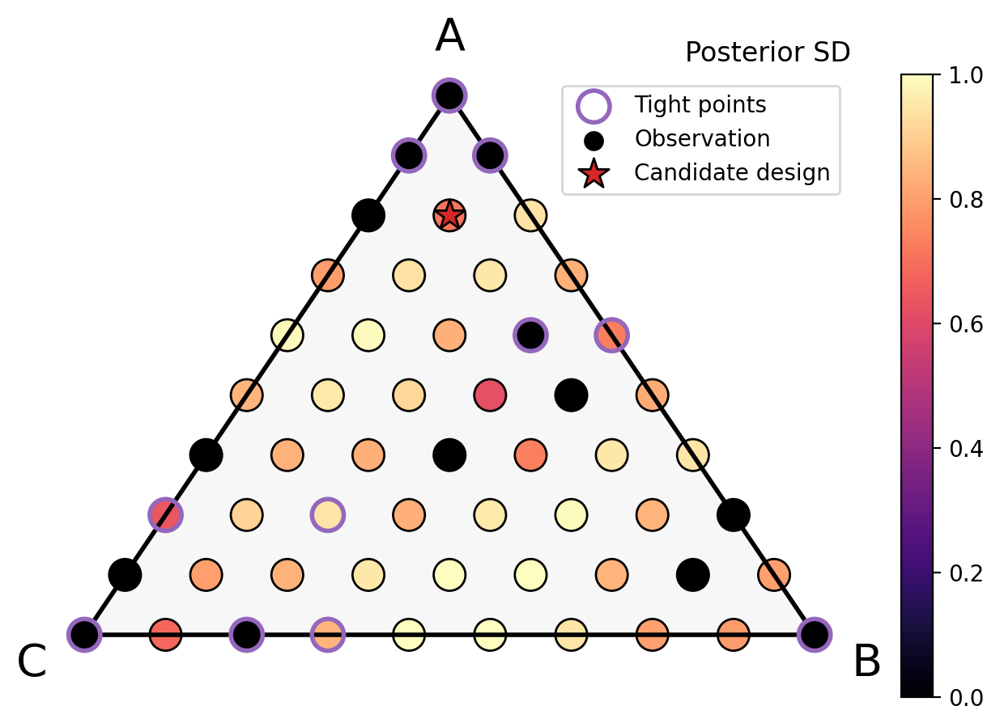

Iteration:  13
CPU times: user 30min 3s, sys: 14.4 s, total: 30min 18s
Wall time: 18min 28s


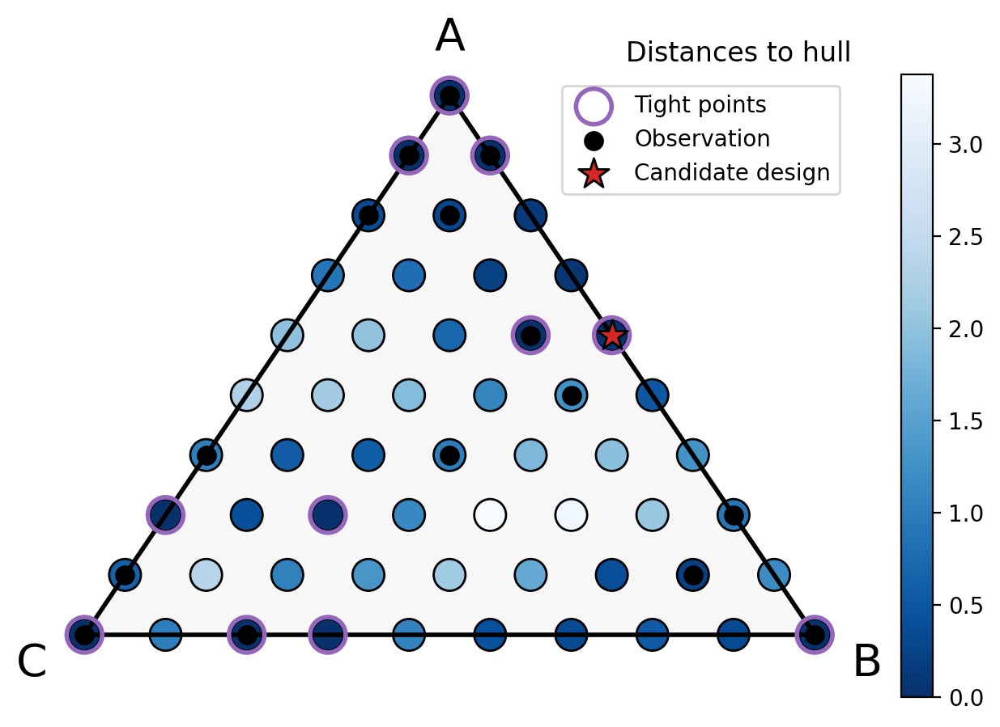

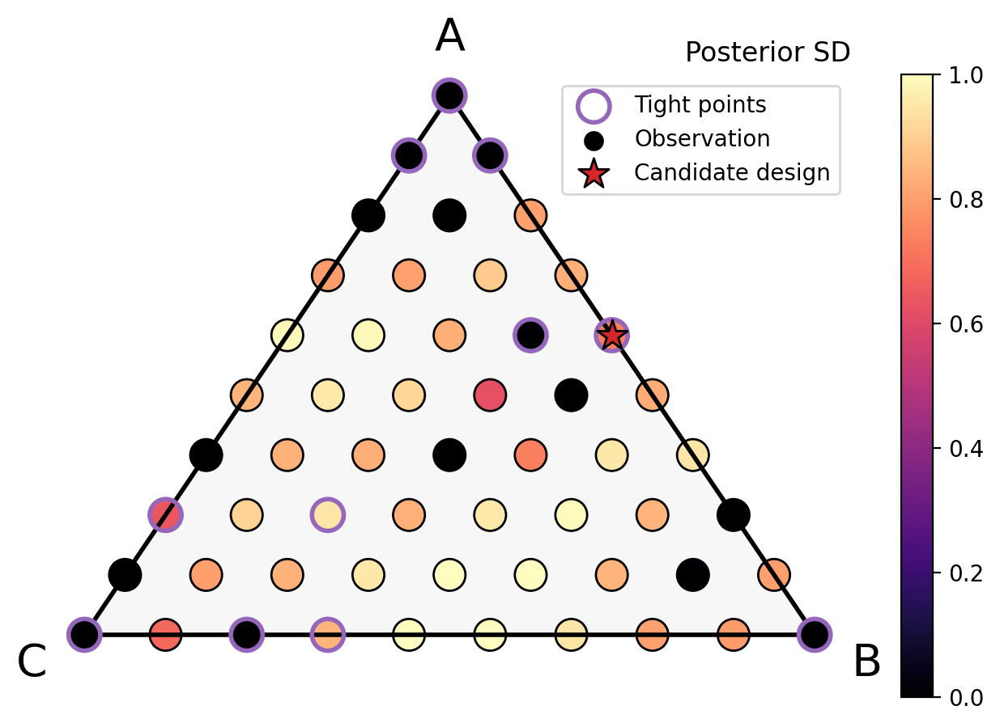

Iteration:  14
CPU times: user 29min 31s, sys: 15.1 s, total: 29min 46s
Wall time: 18min 13s


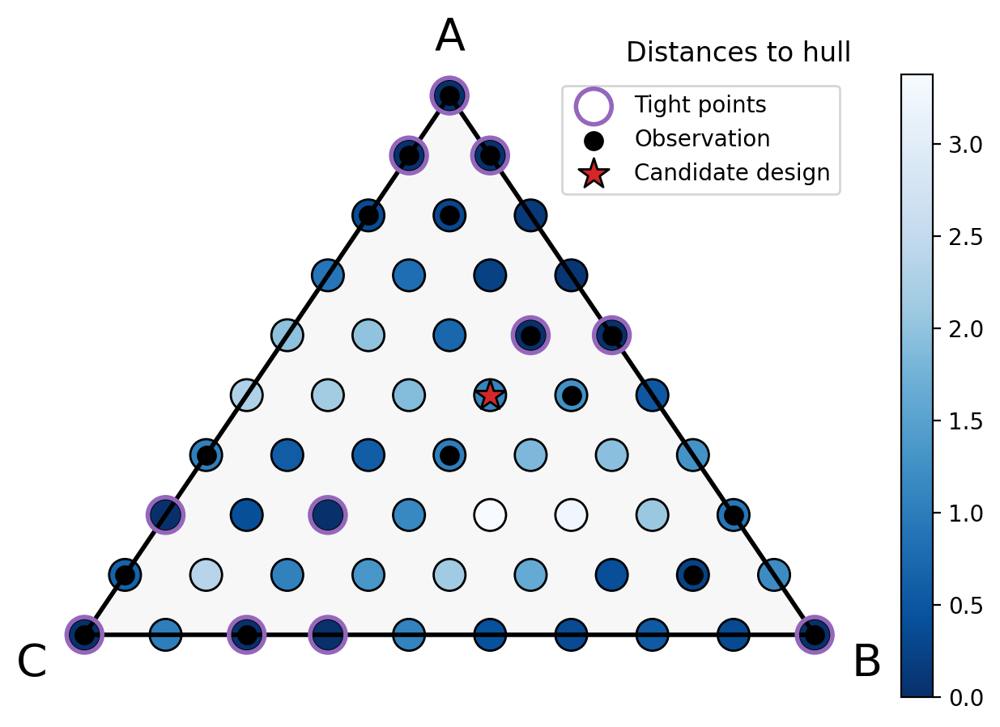

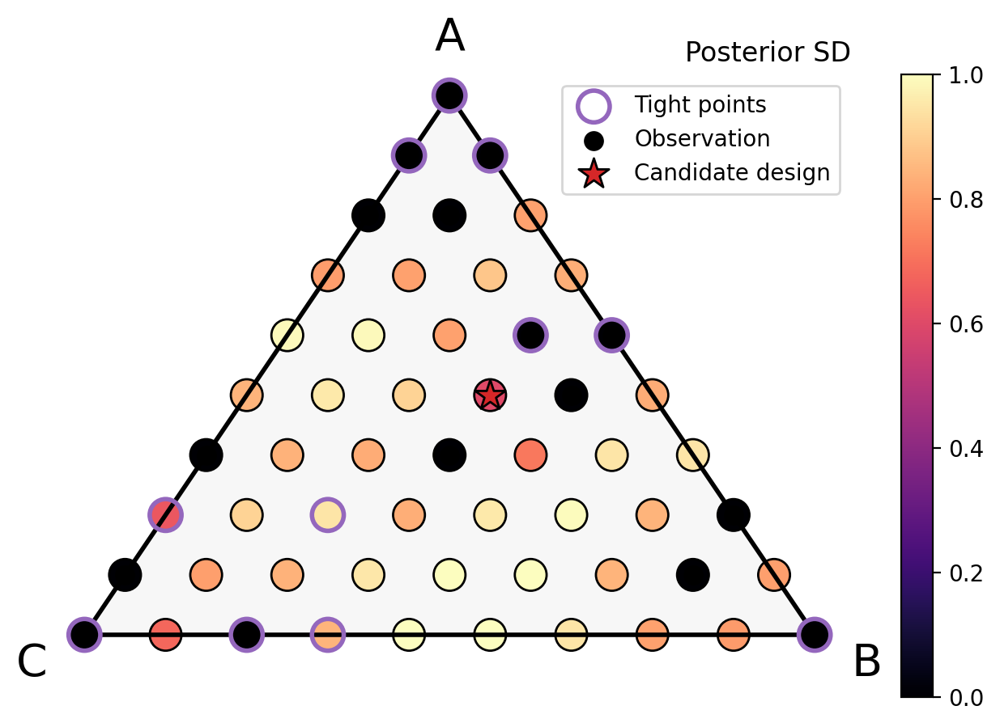

In [46]:
for i in range(6):
    
    print("Iteration: ", i+9)    
    # get candidate design
    %time next_x, entropy_change = get_next_candidate(posterior, params, dataset, designs, design_space, rng_key, T=15, J=20)
    # get the index of candidate w.r.t. full design space
    next_x_ind = (design_space == next_x).sum(1).argmax()

    # plot posterior std
    plot_distances(pts, true_y, true_envelope, next_x=next_x_ind, scale=n_grid, tight_pts=tight_pts, plot_design=False, plot_title=True)
    plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid, plot_title=True, plot_design=False)
    
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
    designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)
    
    pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)

Iteration:  15
CPU times: user 29min 41s, sys: 12.6 s, total: 29min 53s
Wall time: 18min 9s


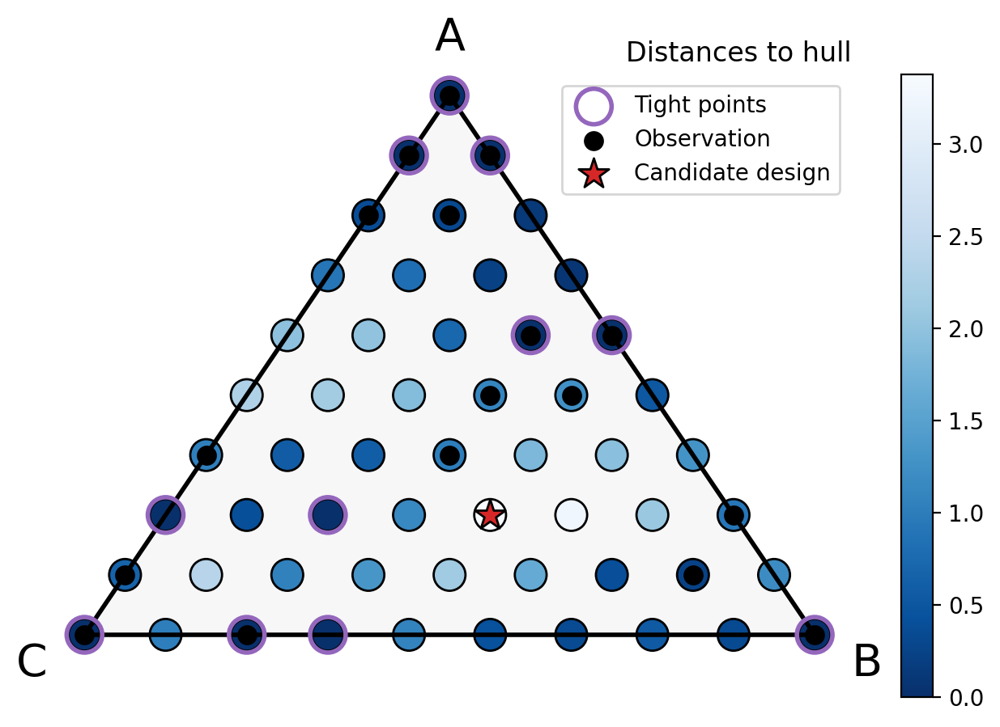

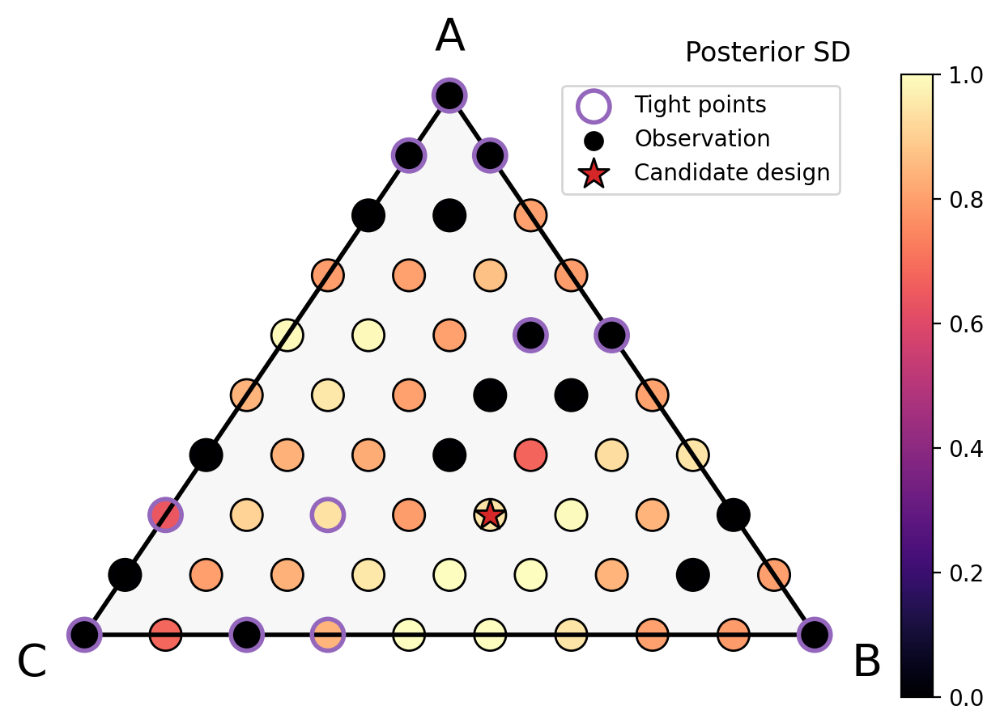

Iteration:  16
CPU times: user 27min 14s, sys: 10.7 s, total: 27min 24s
Wall time: 16min 31s


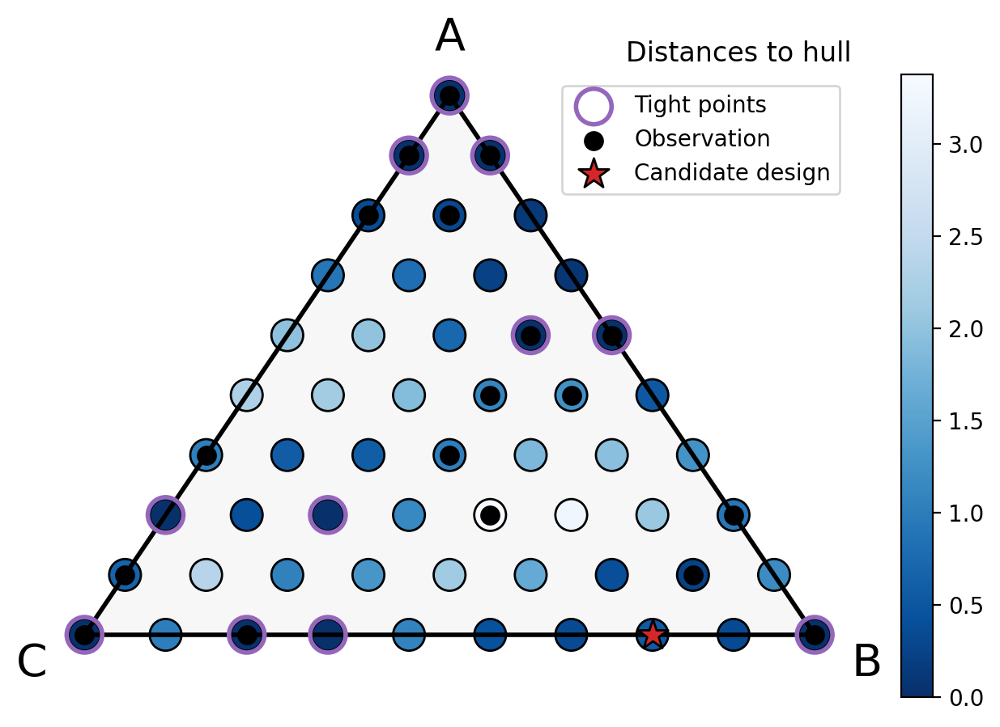

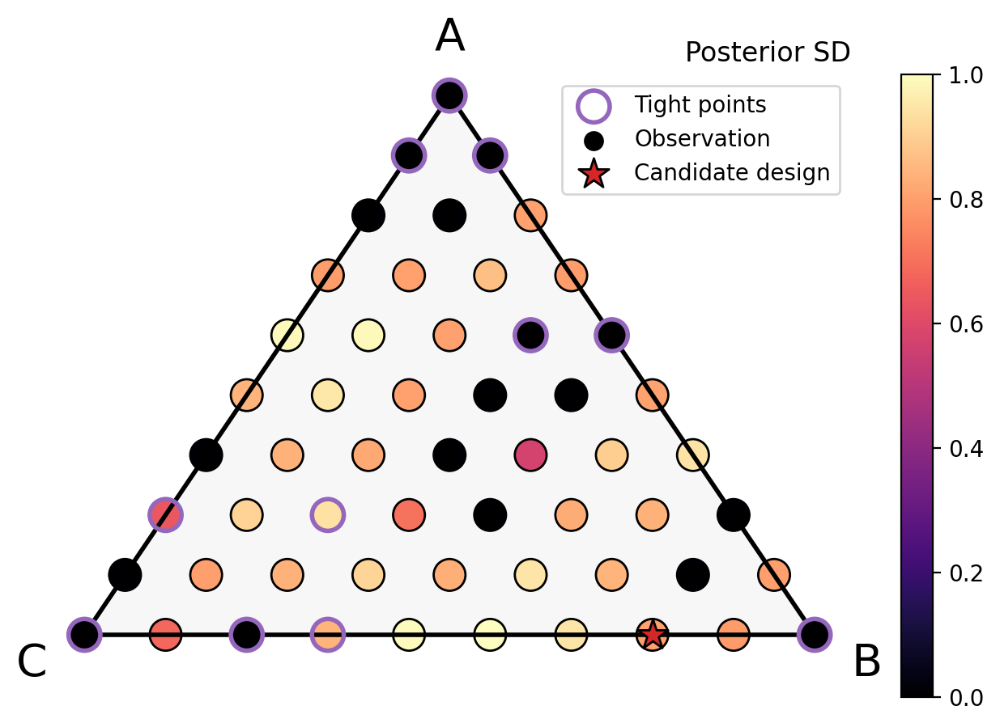

Iteration:  17
CPU times: user 27min 48s, sys: 10.2 s, total: 27min 58s
Wall time: 16min 57s


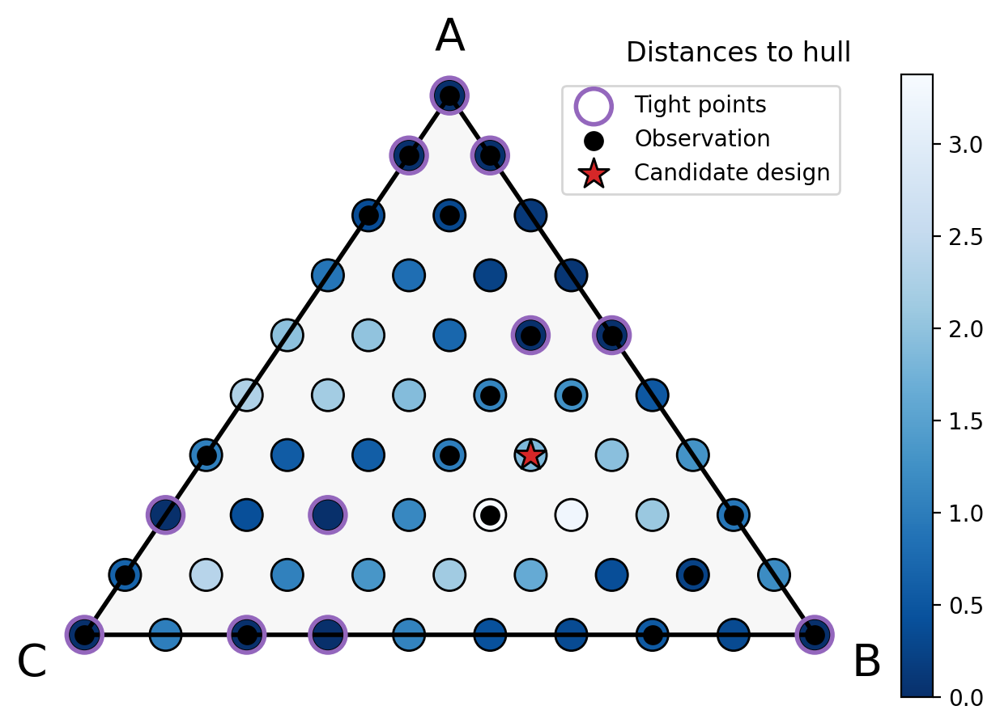

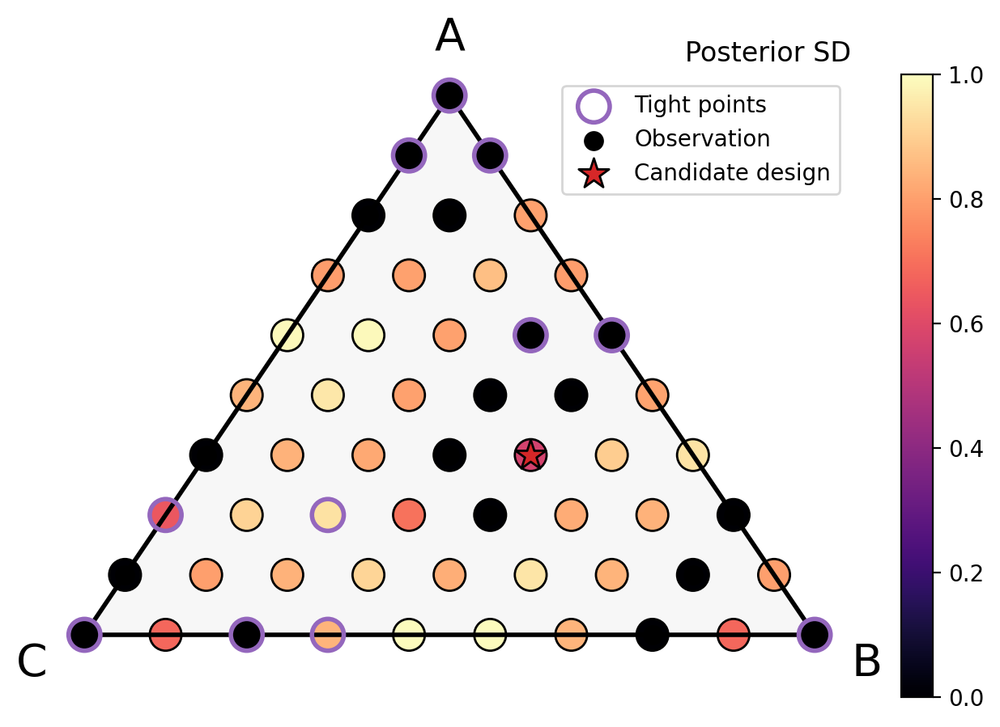

Iteration:  18
CPU times: user 29min 16s, sys: 4.91 s, total: 29min 21s
Wall time: 17min 32s


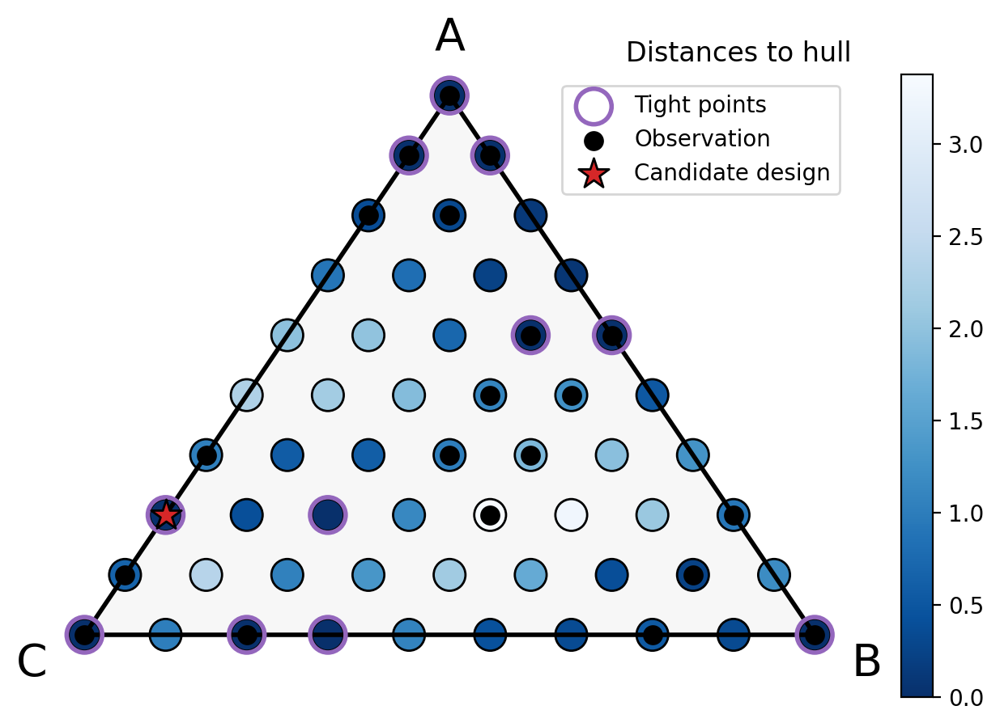

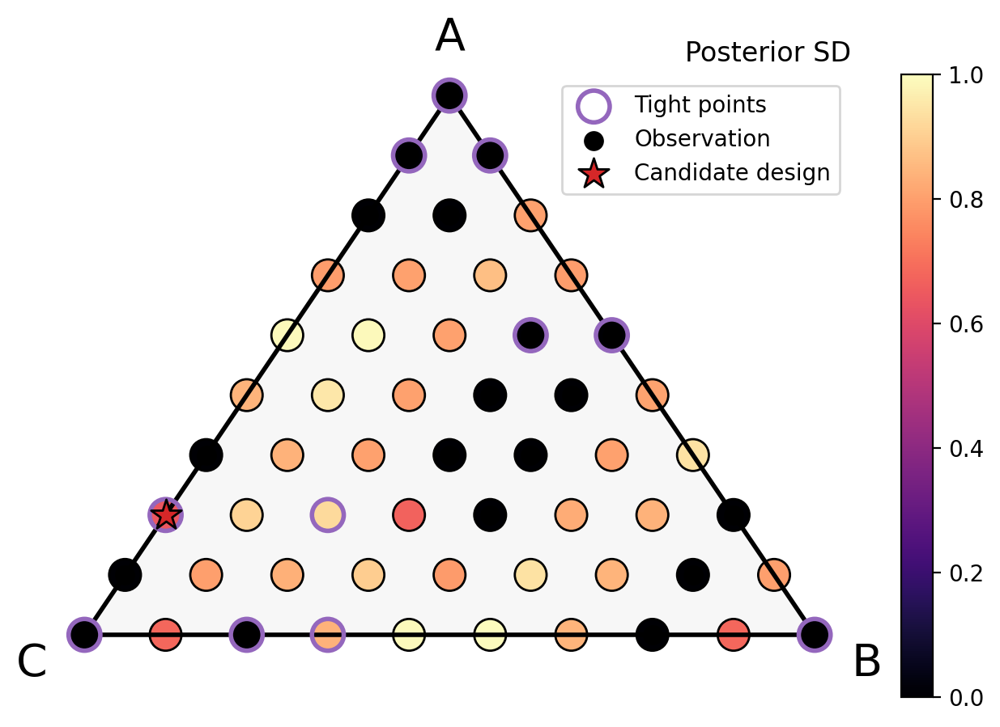

Iteration:  19
CPU times: user 27min 46s, sys: 4.9 s, total: 27min 51s
Wall time: 16min 39s


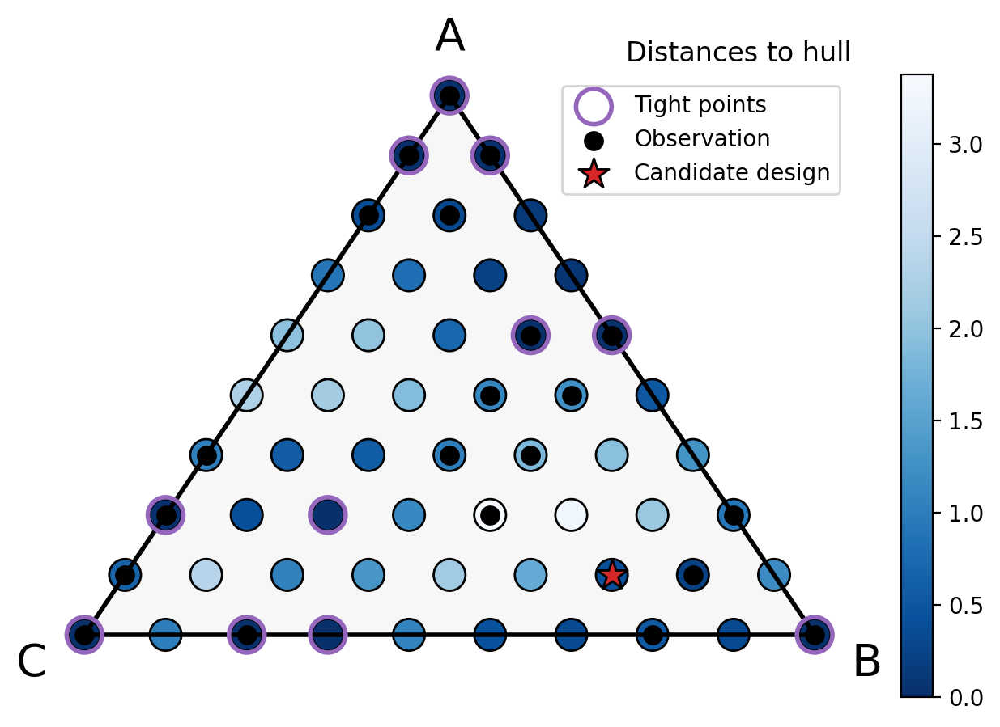

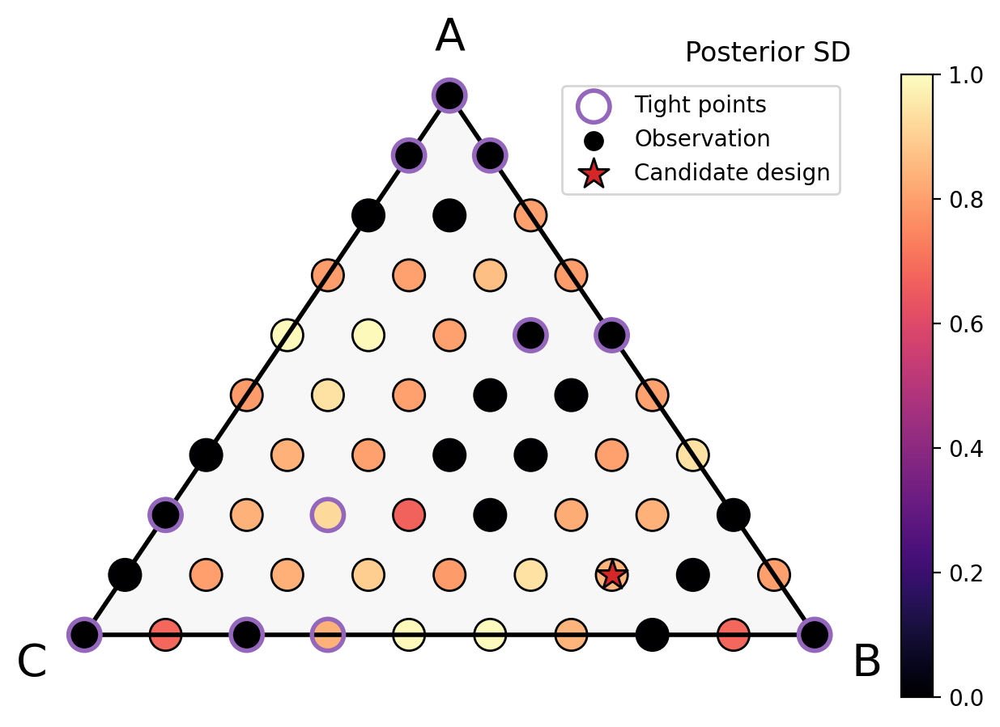

Iteration:  20
CPU times: user 27min 14s, sys: 4.66 s, total: 27min 19s
Wall time: 16min 20s


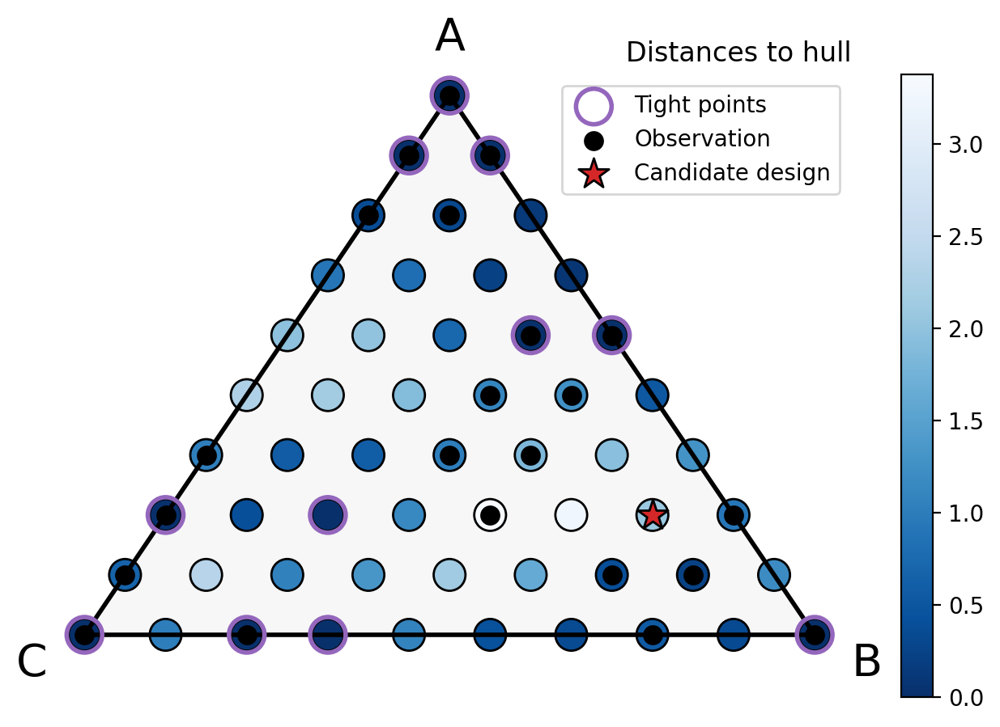

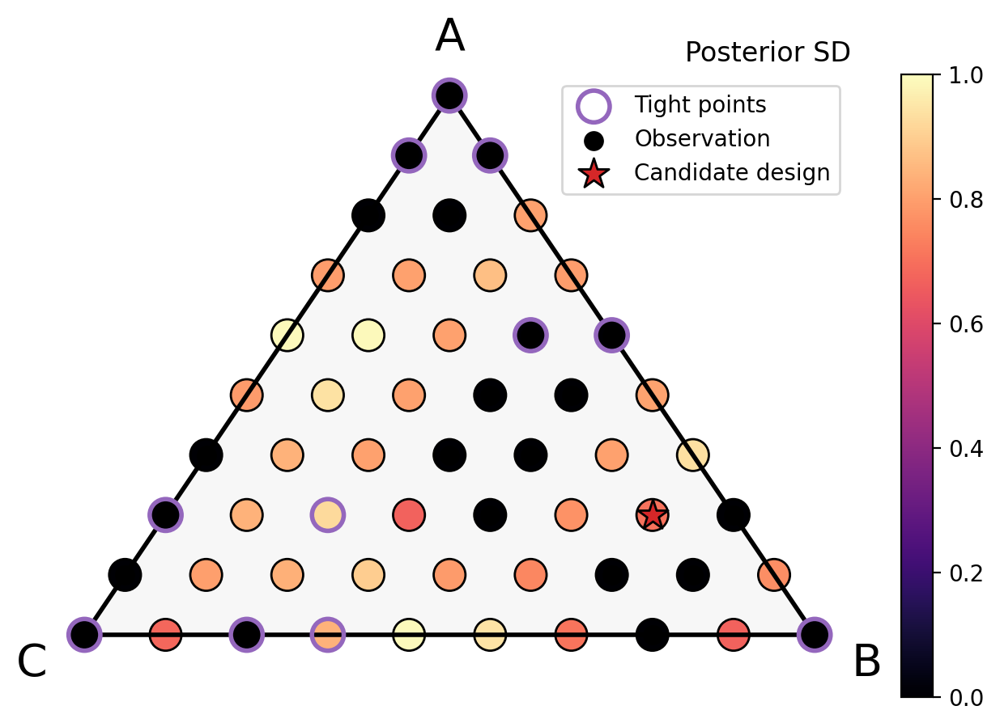

In [47]:
for i in range(6):
    
    print("Iteration: ", i+15)    
    # get candidate design
    %time next_x, entropy_change = get_next_candidate(posterior, params, dataset, designs, design_space, rng_key, T=15, J=20)
    # get the index of candidate w.r.t. full design space
    next_x_ind = (design_space == next_x).sum(1).argmax()

    # plot posterior std
    plot_distances(pts, true_y, true_envelope, next_x=next_x_ind, scale=n_grid, tight_pts=tight_pts, plot_design=False, plot_title=True)
    plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid, plot_title=True, plot_design=False)
    
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
    designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)
    
    pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)

In [ ]:
### Trying again

In [5]:
npr.seed(10); rng_key = jrnd.PRNGKey(1)

num_iters = 14

dataset = Dataset(X=train_x, y=train_y[:,jnp.newaxis])
designs = design_space[1:-1]

# Update the model given the data above
pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)

num_tights = 2; tights_convex = [num_tights]

for i in range(num_iters):
    
    print("Iteration: ", i)    
    # get candidate design
    %time next_x, entropy_change = get_next_candidate(posterior, params, dataset, designs, design_space, rng_key, T=40, J=50)
    # get the index of candidate w.r.t. full design space
    next_x_ind = (design_space == next_x).sum(1).argmax()

    # plot posterior std
    plot_distances(pts, true_y, true_envelope, dataset, next_x=next_x_ind, scale=n_grid, tight_pts=tight_pts, plot_design=False, plot_title=True)
    plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid, plot_title=True, plot_design=False)
    
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
    designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)
    
    pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)
    
    # Print # of tight points found
    y_ind = (true_y == float(true_y[next_x_ind])).argmax()
    if tights.ravel()[int(y_ind)]:
        num_tights += 1
    print("Number of tight points after observing candidate: ", num_tights)
    tights_convex.append(num_tights)

Iteration:  0
CPU times: user 4h 43min 35s, sys: 2min 45s, total: 4h 46min 20s
Wall time: 2h 53min 27s


TypeError: plot_distances() missing 1 required positional argument: 'dataset'

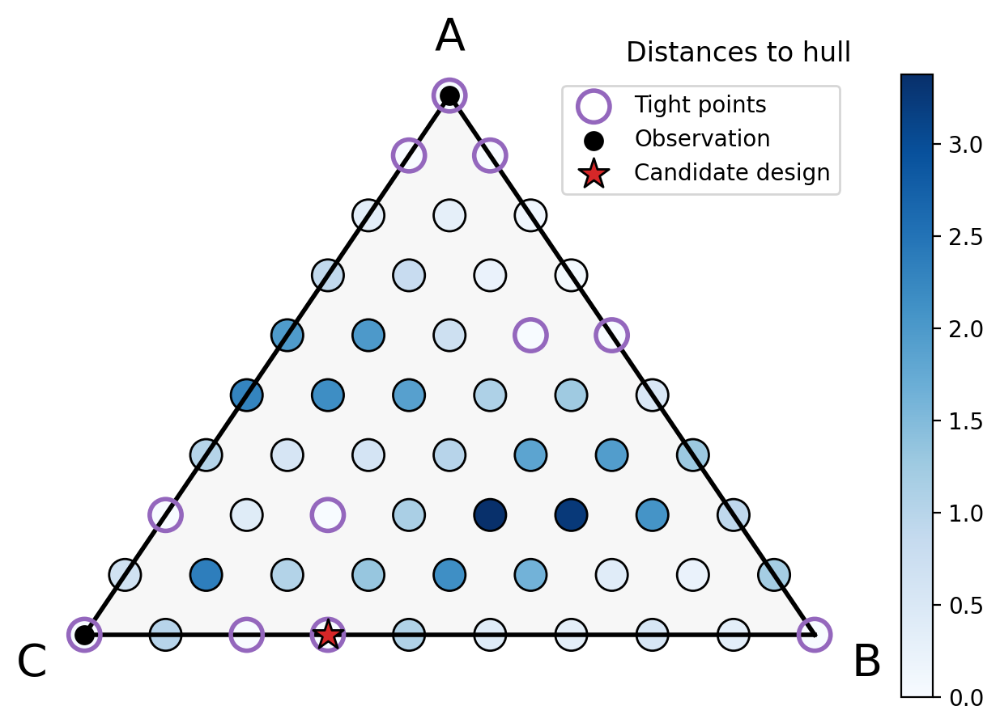

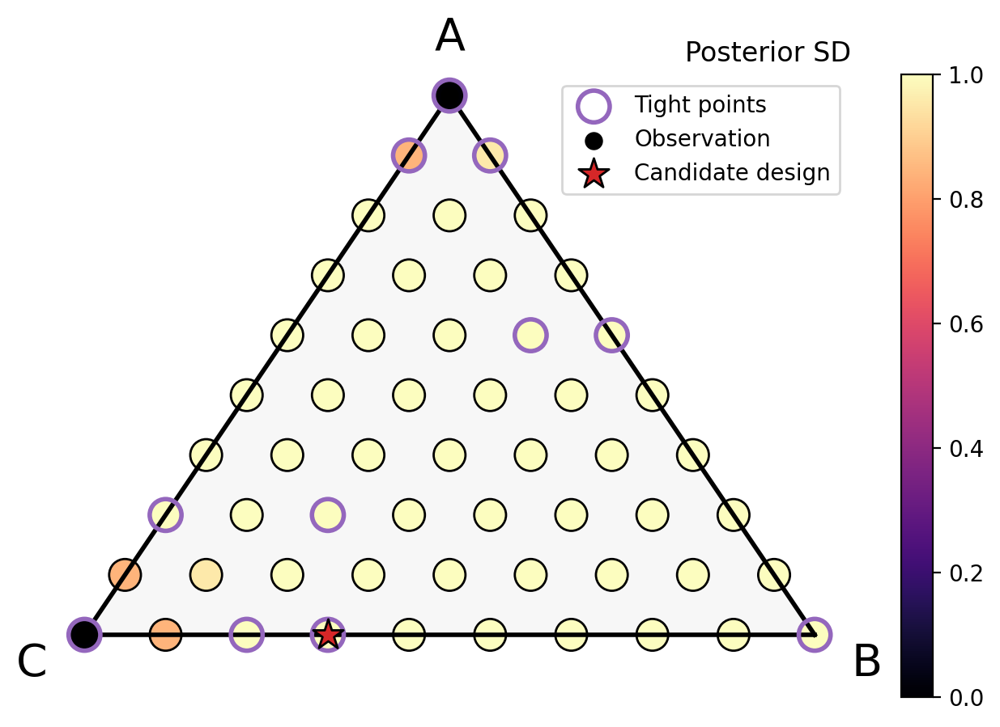

In [16]:
plot_distances(pts, true_y, true_envelope, dataset, next_x=next_x_ind, scale=n_grid, tight_pts=tight_pts, plot_design=False, plot_title=True)
plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid, plot_title=True, plot_design=False)
    
dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)

pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)

In [12]:
# Print # of tight points found
y_ind = (true_y == float(true_y[next_x_ind])).argmax()
if tights.ravel()[int(y_ind)]:
    num_tights += 1
print("Number of tight points after observing candidate: ", num_tights)
tights_convex.append(num_tights)

Number of tight points after observing candidate:  3


In [17]:
dataset.X

Array([[0.        , 0.        ],
       [0.        , 1.        ],
       [0.33333333, 0.        ]], dtype=float64)

In [ ]:
for i in range(num_iters):
    
    print("Iteration: ", i)    
    # get candidate design
    %time next_x, entropy_change = get_next_candidate(posterior, params, dataset, designs, design_space, rng_key, T=40, J=60)
    # get the index of candidate w.r.t. full design space
    next_x_ind = (design_space == next_x).sum(1).argmax()

    # plot posterior std
    plot_distances(pts, true_y, true_envelope, dataset, next_x=next_x_ind, scale=n_grid, tight_pts=tight_pts, plot_design=False, plot_title=True)
    plot_std(posterior, dataset, params, pts, next_x=next_x_ind, tight_pts=tight_pts, scale=n_grid, plot_title=True, plot_design=False)
    
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(true_y[next_x_ind]))
    designs = jnp.delete(designs, (designs == next_x).sum(1).argmax(), axis=0)
    
    pred_mean, pred_cov, posterior, params = update_model(dataset, design_space, rng_key, update_params=False)
    
    # Print # of tight points found
    y_ind = (true_y == float(true_y[next_x_ind])).argmax()
    if tights.ravel()[int(y_ind)]:
        num_tights += 1
    print("Number of tight points after observing candidate: ", num_tights)
    tights_convex.append(num_tights)